# Demo of segmentation with shape incorporation

### Import libraries

In [1]:
import numpy as np
import os
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
from torch.autograd import Variable
from torch.utils.data import DataLoader

import torchvision.transforms as transforms
import torchvision.utils as vutils

# ===================================
#         Import custom codes
# ===================================
import config

from datasets import LSUNSegDataset

from metrics import metric_seg

from networks import generator
from networks import discriminator

### Configuration

In [2]:
# config - data
height = 64
width = 64
segment_data_test_dir = './data/sample_data/lsun/car'

# config - networks
trained_ckpt_path = './pretrained/lsun/shape_seg/lsun_car/trained_model_by_best_val_iou.pth'
num_in_channel = 3
num_out_channel = 3

# config - inference environment
test_batch_size = 1
num_workers = 6
multi_gpu = False
num_gpu = 1
cuda_id = 'cuda:0'

### Load data

In [3]:
# transforms
transform_test = transforms.Compose([
                            transforms.ToTensor()
                            ])
transform_target = transforms.Compose([
                            transforms.ToTensor()
                            ]) 

# dataset
dataset_test = LSUNSegDataset.LSUNSegTestDataset(
    segment_data_test_dir,
    transform=transform_test,
    transform_gt=transform_target)

# dataloader
loader_test = torch.utils.data.DataLoader(
    dataset = dataset_test,
    batch_size=test_batch_size,
    shuffle=True,
    num_workers=num_workers,
    drop_last=False)

#-Data-# Total Data Path Loading Time: 0.0h 0.0m 0.002858877182006836s


### Set inference environment

In [4]:
torch.cuda.set_device(cuda_id)
cuda = True if torch.cuda.is_available() else False
Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor

if multi_gpu:
    device = torch.device("cuda:0" if (torch.cuda.is_available()) else "cpu")
    ngpu = num_gpu # should be modified to specify multiple gpu ids to be used
elif cuda_id:
    device = torch.device(cuda_id)
    ngpu = 1
else:
    device = torch.device('cpu')
    ngpu = 0

if multi_gpu == False:
    device = torch.device(cuda_id)
    num_gpu = 1

### Set models

In [5]:
model_segment_encoder = generator.Encoder(num_in_channel, num_out_channel).to(device)
model_segment_decoder_seg = generator.DecoderSeg(num_in_channel, num_out_channel).to(device)
model_segment_decoder_region = generator.DecoderRegion(num_in_channel, num_out_channel).to(device)

# if multiple gpus are used, set dataparallel
if multi_gpu == True:
    model_segment_encoder = nn.DataParallel(model_segment_encoder, list(range(num_gpu)))
    model_segment_decoder_seg = nn.DataParallel(model_segment_decoder_seg, list(range(num_gpu)))
    model_segment_decoder_region = nn.DataParallel(model_segment_decoder_region, list(range(num_gpu)))

# load trained model parameters
trained_model = torch.load(trained_ckpt_path, map_location='cpu')
model_segment_encoder.load_state_dict(trained_model['model_segment_encoder'], strict=False)
print("[*] Trained segment_encoder model has been loaded")
model_segment_decoder_seg.load_state_dict(trained_model['model_segment_decoder_seg'], strict=False)
print("[*] Trained segment_decoder_seg model has been loaded")
model_segment_decoder_region.load_state_dict(trained_model['model_segment_decoder_region'], strict=False)
print("[*] Trained segment_decoder_region model has been loaded")

[*] Trained segment_encoder model has been loaded
[*] Trained segment_decoder_seg model has been loaded
[*] Trained segment_decoder_region model has been loaded


### Inference with sample data

[*] Result of 001/290 (IoU: 0.803488)


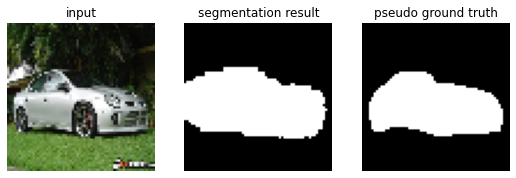

[*] Result of 002/290 (IoU: 0.817356)


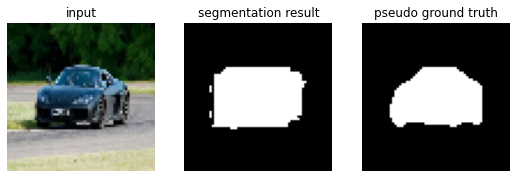

[*] Result of 003/290 (IoU: 0.802109)


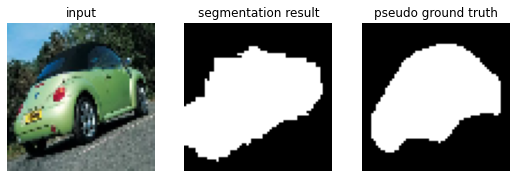

[*] Result of 004/290 (IoU: 0.843229)


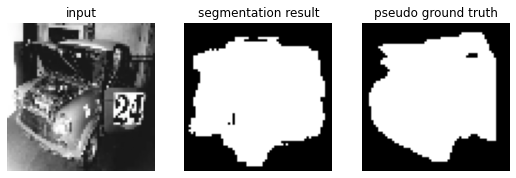

[*] Result of 005/290 (IoU: 0.816655)


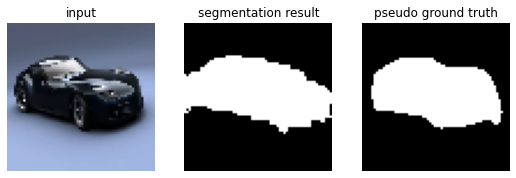

[*] Result of 006/290 (IoU: 0.809886)


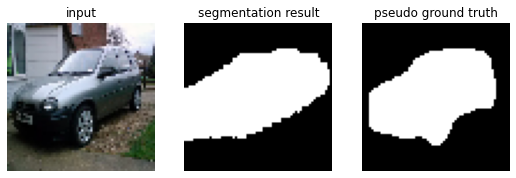

[*] Result of 007/290 (IoU: 0.813325)


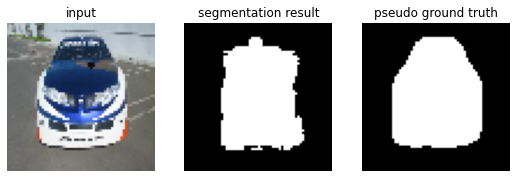

[*] Result of 008/290 (IoU: 0.815145)


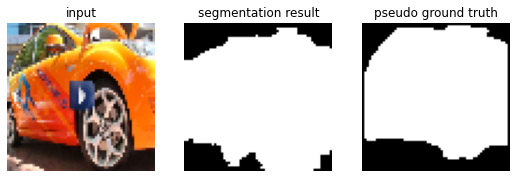

[*] Result of 009/290 (IoU: 0.829320)


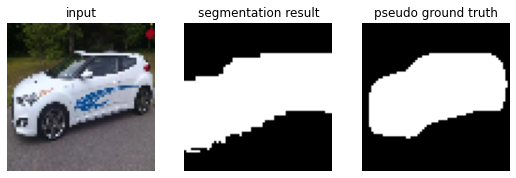

[*] Result of 010/290 (IoU: 0.806409)


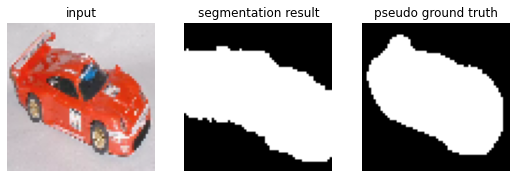

[*] Result of 011/290 (IoU: 0.830200)


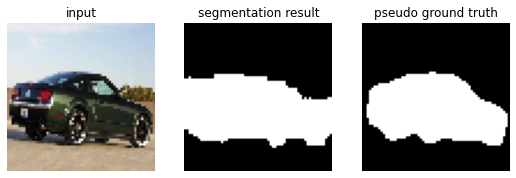

[*] Result of 012/290 (IoU: 0.804076)


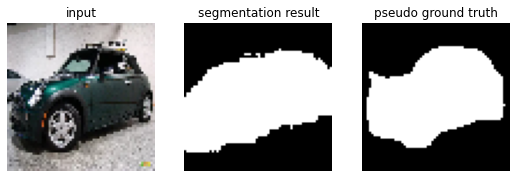

[*] Result of 013/290 (IoU: 0.802978)


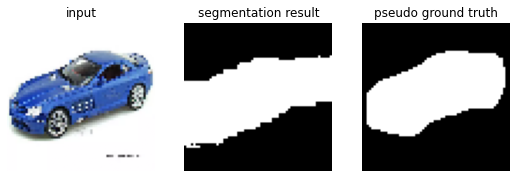

[*] Result of 014/290 (IoU: 0.856142)


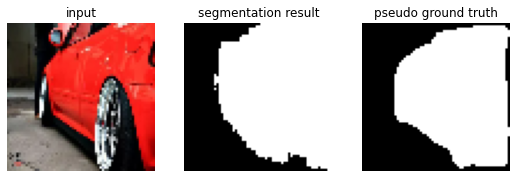

[*] Result of 015/290 (IoU: 0.835706)


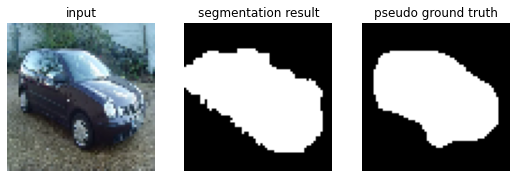

[*] Result of 016/290 (IoU: 0.813155)


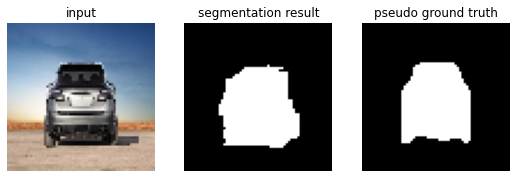

[*] Result of 017/290 (IoU: 0.801958)


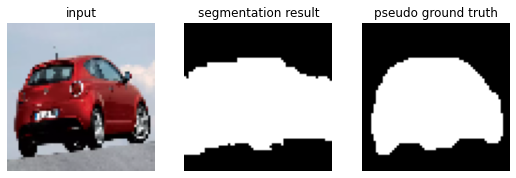

[*] Result of 018/290 (IoU: 0.803647)


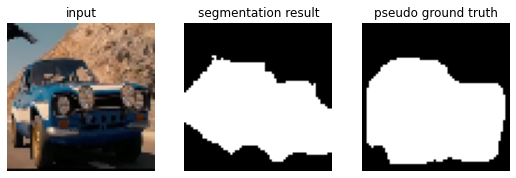

[*] Result of 019/290 (IoU: 0.801942)


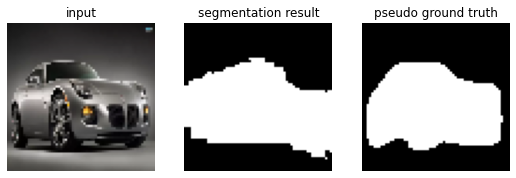

[*] Result of 020/290 (IoU: 0.802823)


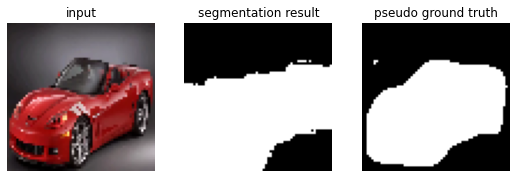

[*] Result of 021/290 (IoU: 0.808081)


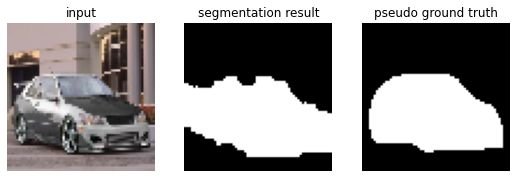

[*] Result of 022/290 (IoU: 0.849723)


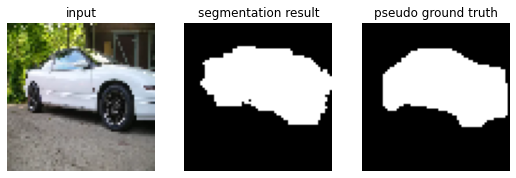

[*] Result of 023/290 (IoU: 0.801389)


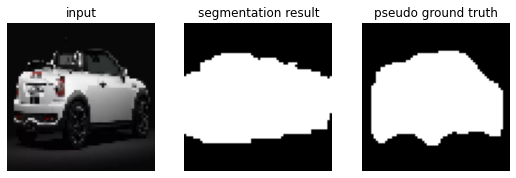

[*] Result of 024/290 (IoU: 0.838710)


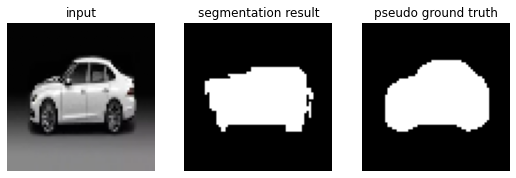

[*] Result of 025/290 (IoU: 0.807744)


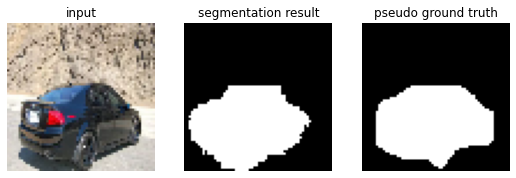

[*] Result of 026/290 (IoU: 0.810782)


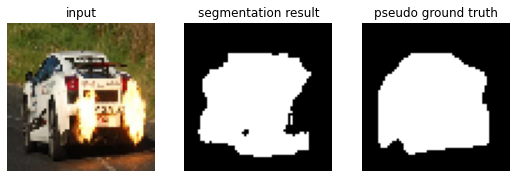

[*] Result of 027/290 (IoU: 0.802910)


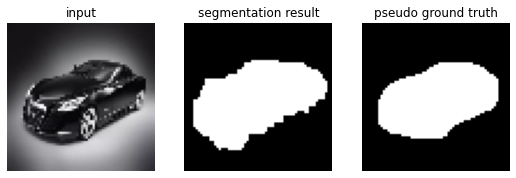

[*] Result of 028/290 (IoU: 0.801814)


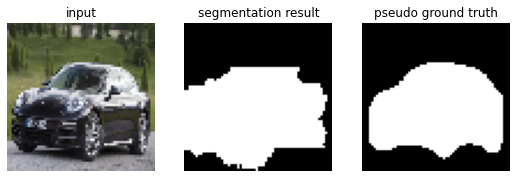

[*] Result of 029/290 (IoU: 0.811996)


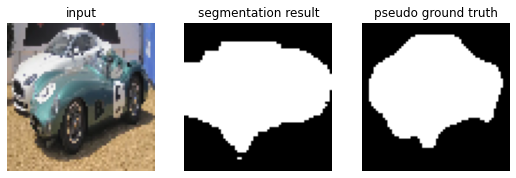

[*] Result of 030/290 (IoU: 0.837748)


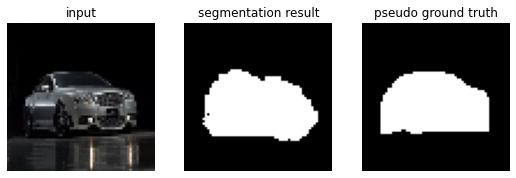

[*] Result of 031/290 (IoU: 0.813026)


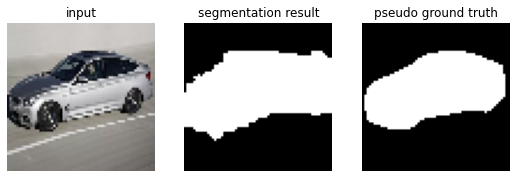

[*] Result of 032/290 (IoU: 0.804223)


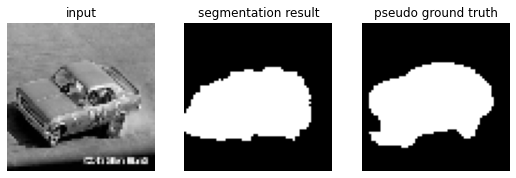

[*] Result of 033/290 (IoU: 0.854626)


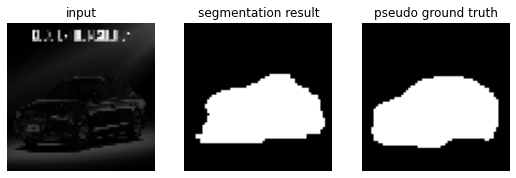

[*] Result of 034/290 (IoU: 0.816985)


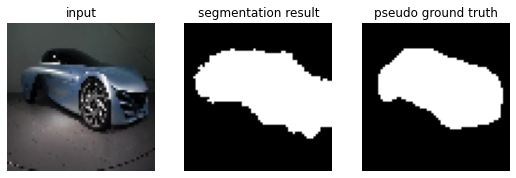

[*] Result of 035/290 (IoU: 0.814800)


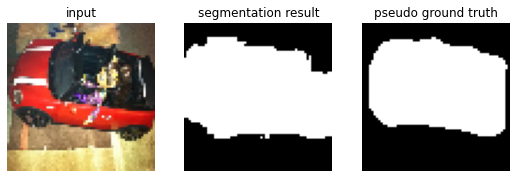

[*] Result of 036/290 (IoU: 0.813258)


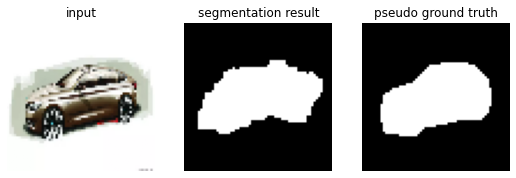

[*] Result of 037/290 (IoU: 0.820199)


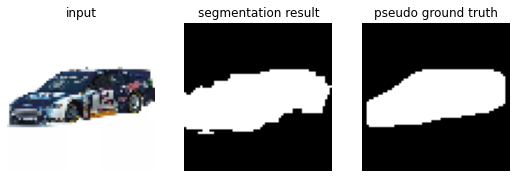

[*] Result of 038/290 (IoU: 0.804255)


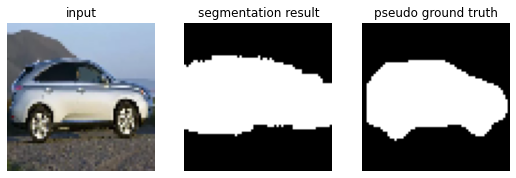

[*] Result of 039/290 (IoU: 0.811696)


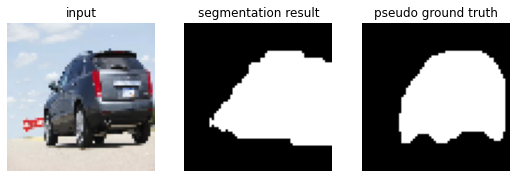

[*] Result of 040/290 (IoU: 0.805109)


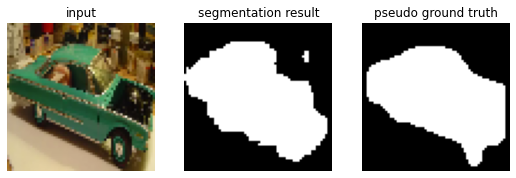

[*] Result of 041/290 (IoU: 0.809798)


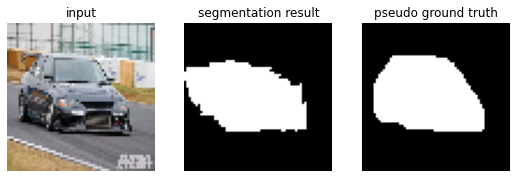

[*] Result of 042/290 (IoU: 0.819735)


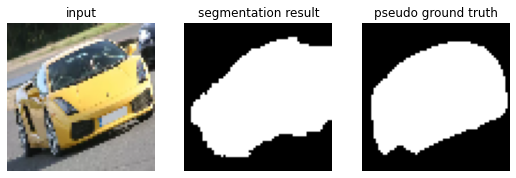

[*] Result of 043/290 (IoU: 0.841361)


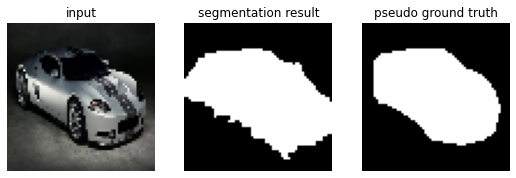

[*] Result of 044/290 (IoU: 0.830056)


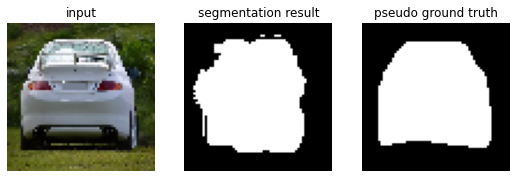

[*] Result of 045/290 (IoU: 0.830059)


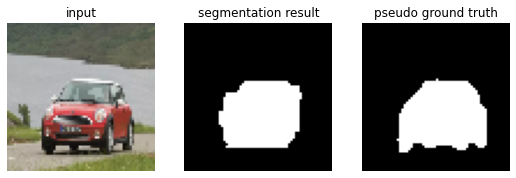

[*] Result of 046/290 (IoU: 0.848145)


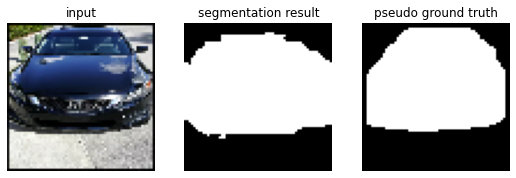

[*] Result of 047/290 (IoU: 0.818398)


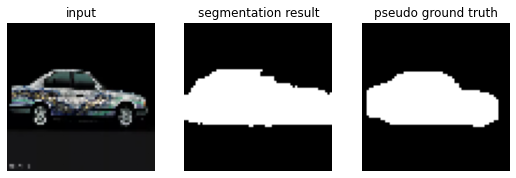

[*] Result of 048/290 (IoU: 0.826650)


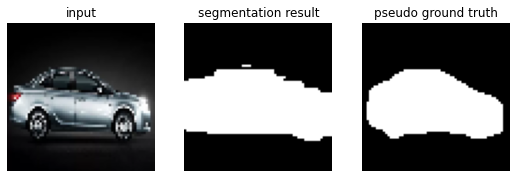

[*] Result of 049/290 (IoU: 0.801856)


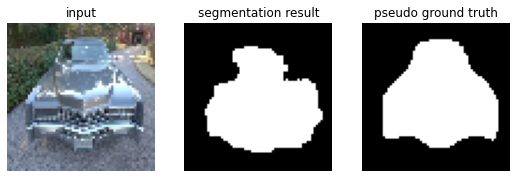

[*] Result of 050/290 (IoU: 0.839074)


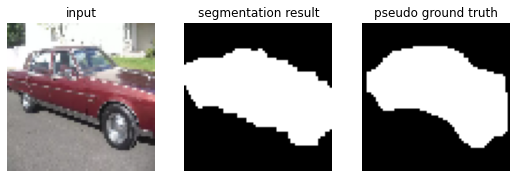

[*] Result of 051/290 (IoU: 0.804158)


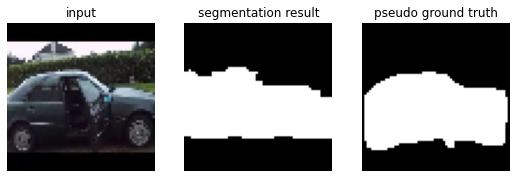

[*] Result of 052/290 (IoU: 0.808108)


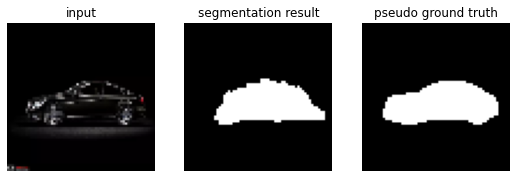

[*] Result of 053/290 (IoU: 0.806392)


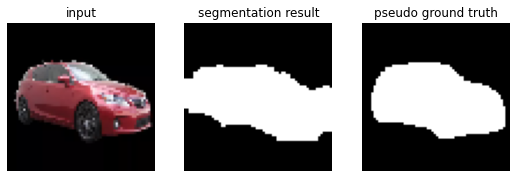

[*] Result of 054/290 (IoU: 0.831683)


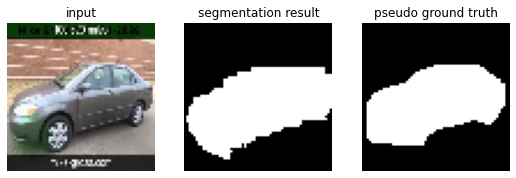

[*] Result of 055/290 (IoU: 0.801541)


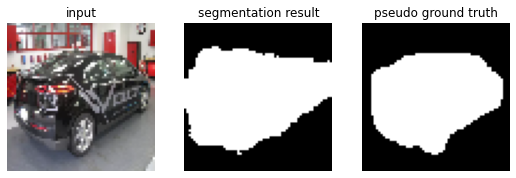

[*] Result of 056/290 (IoU: 0.803519)


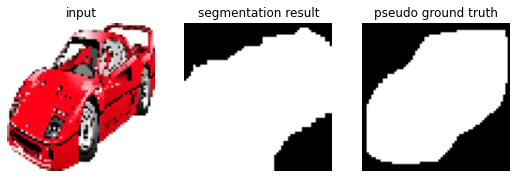

[*] Result of 057/290 (IoU: 0.817080)


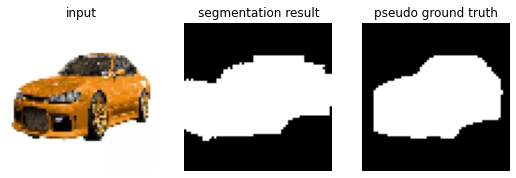

[*] Result of 058/290 (IoU: 0.813808)


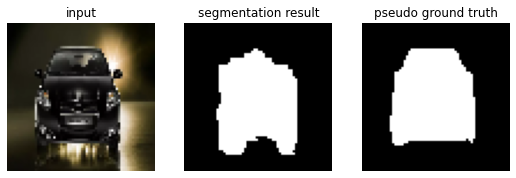

[*] Result of 059/290 (IoU: 0.811029)


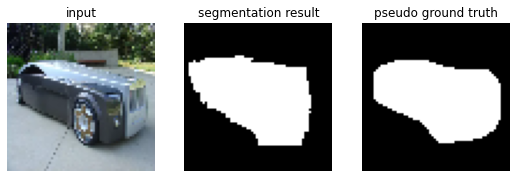

[*] Result of 060/290 (IoU: 0.826183)


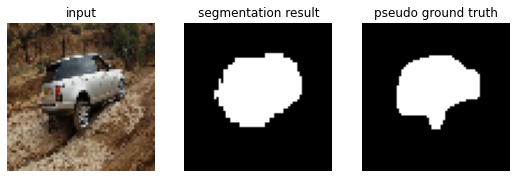

[*] Result of 061/290 (IoU: 0.800166)


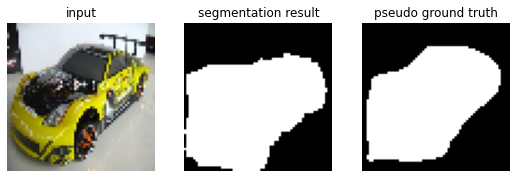

[*] Result of 062/290 (IoU: 0.863478)


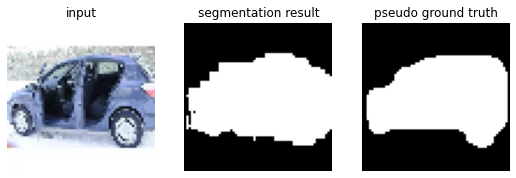

[*] Result of 063/290 (IoU: 0.828571)


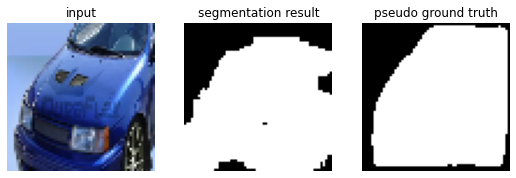

[*] Result of 064/290 (IoU: 0.829073)


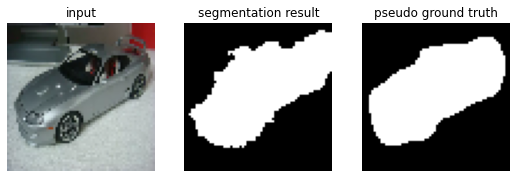

[*] Result of 065/290 (IoU: 0.804928)


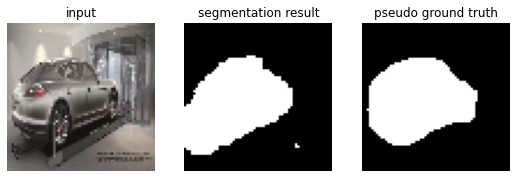

[*] Result of 066/290 (IoU: 0.858355)


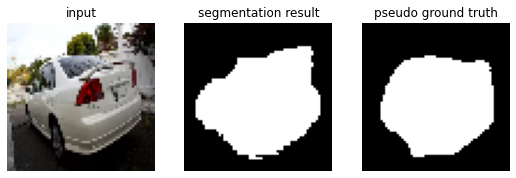

[*] Result of 067/290 (IoU: 0.804132)


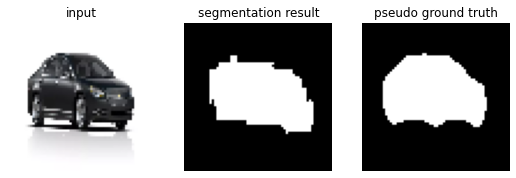

[*] Result of 068/290 (IoU: 0.812696)


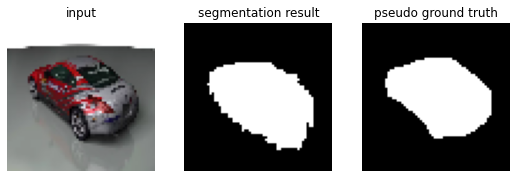

[*] Result of 069/290 (IoU: 0.832757)


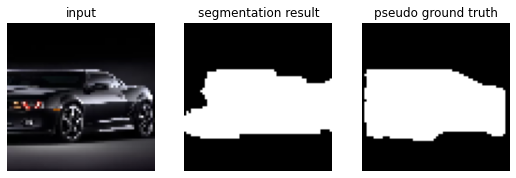

[*] Result of 070/290 (IoU: 0.805166)


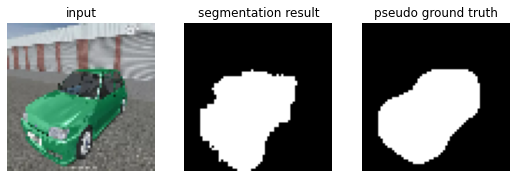

[*] Result of 071/290 (IoU: 0.853367)


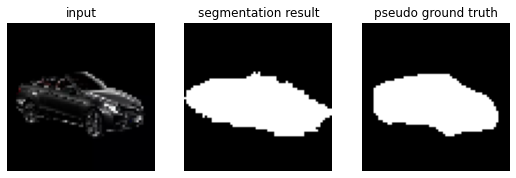

[*] Result of 072/290 (IoU: 0.801567)


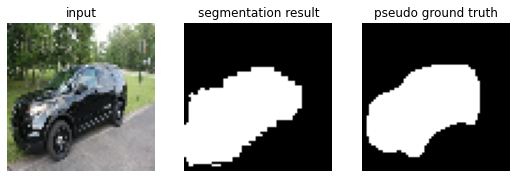

[*] Result of 073/290 (IoU: 0.820544)


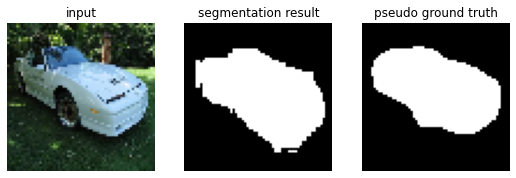

[*] Result of 074/290 (IoU: 0.800215)


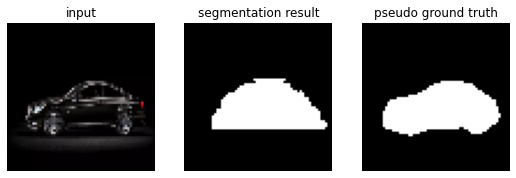

[*] Result of 075/290 (IoU: 0.818182)


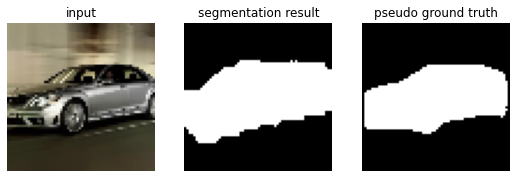

[*] Result of 076/290 (IoU: 0.800000)


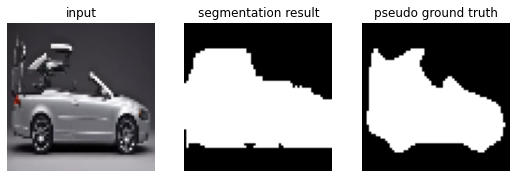

[*] Result of 077/290 (IoU: 0.814897)


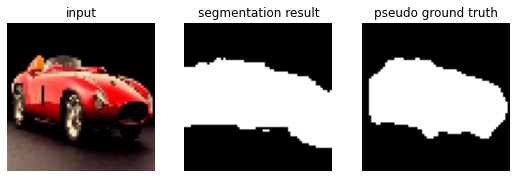

[*] Result of 078/290 (IoU: 0.806597)


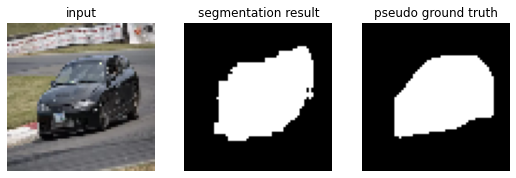

[*] Result of 079/290 (IoU: 0.804284)


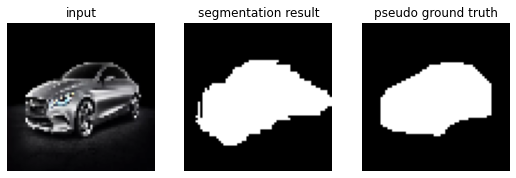

[*] Result of 080/290 (IoU: 0.831338)


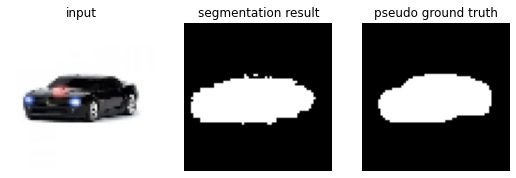

[*] Result of 081/290 (IoU: 0.806283)


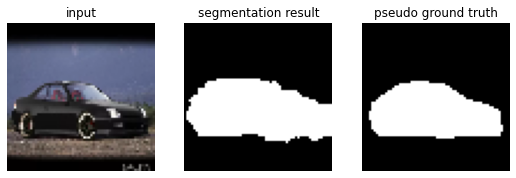

[*] Result of 082/290 (IoU: 0.834350)


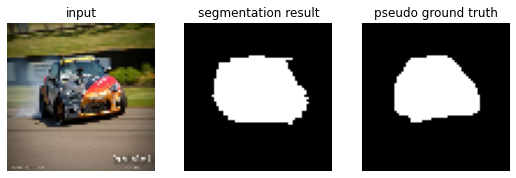

[*] Result of 083/290 (IoU: 0.829503)


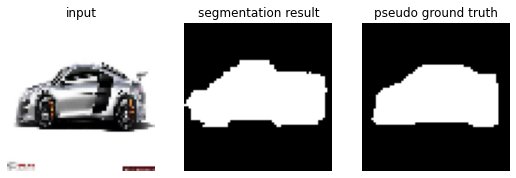

[*] Result of 084/290 (IoU: 0.801739)


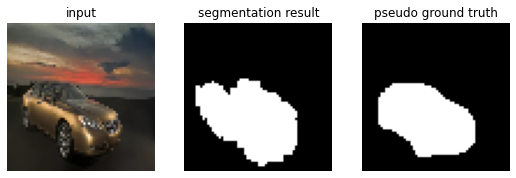

[*] Result of 085/290 (IoU: 0.825588)


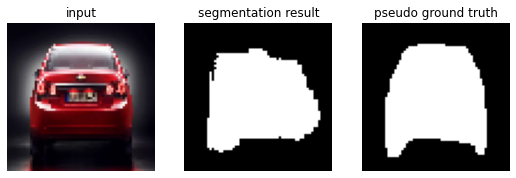

[*] Result of 086/290 (IoU: 0.842075)


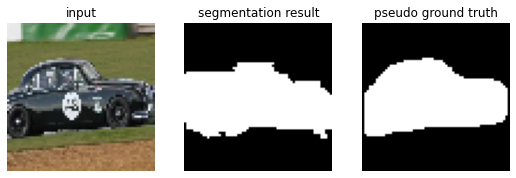

[*] Result of 087/290 (IoU: 0.853191)


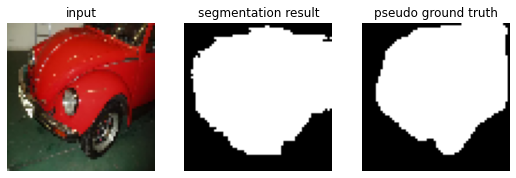

[*] Result of 088/290 (IoU: 0.845330)


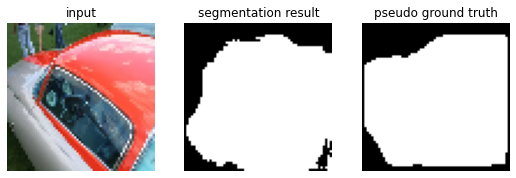

[*] Result of 089/290 (IoU: 0.821192)


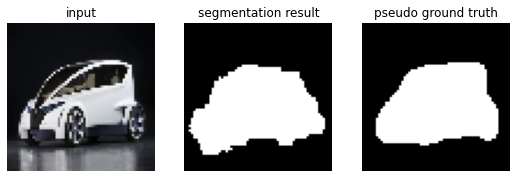

[*] Result of 090/290 (IoU: 0.802830)


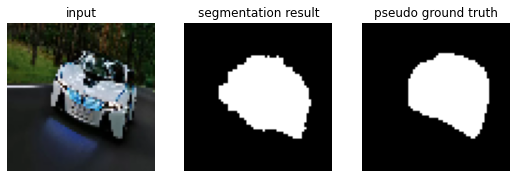

[*] Result of 091/290 (IoU: 0.809788)


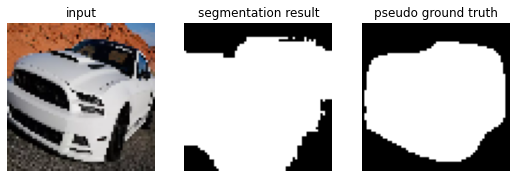

[*] Result of 092/290 (IoU: 0.803881)


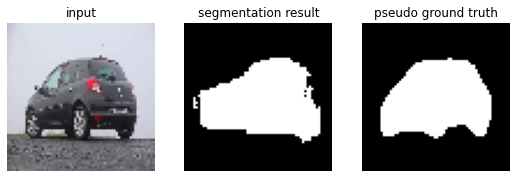

[*] Result of 093/290 (IoU: 0.810955)


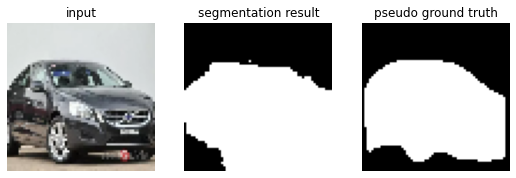

[*] Result of 094/290 (IoU: 0.801410)


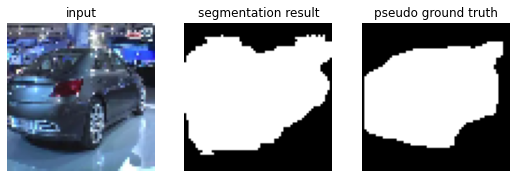

[*] Result of 095/290 (IoU: 0.812584)


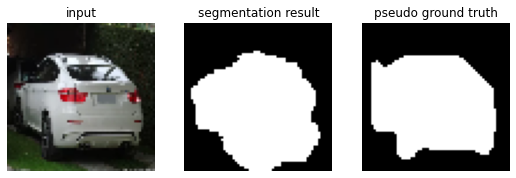

[*] Result of 096/290 (IoU: 0.813569)


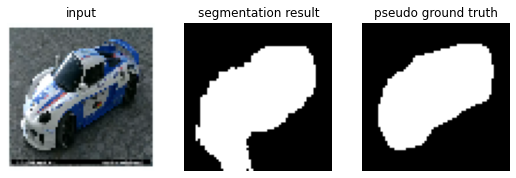

[*] Result of 097/290 (IoU: 0.876003)


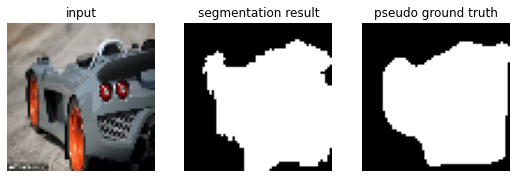

[*] Result of 098/290 (IoU: 0.850612)


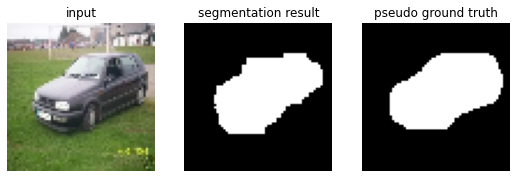

[*] Result of 099/290 (IoU: 0.801301)


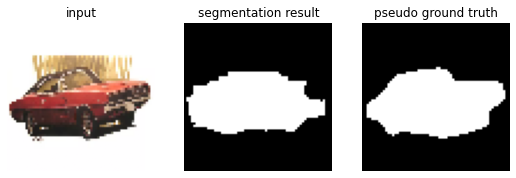

[*] Result of 100/290 (IoU: 0.833772)


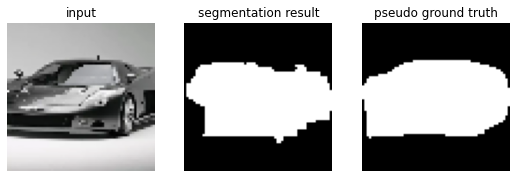

[*] Result of 101/290 (IoU: 0.843165)


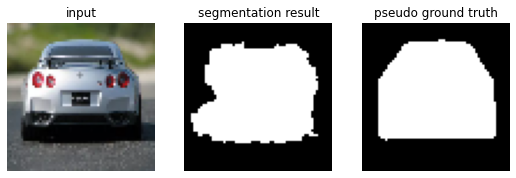

[*] Result of 102/290 (IoU: 0.820559)


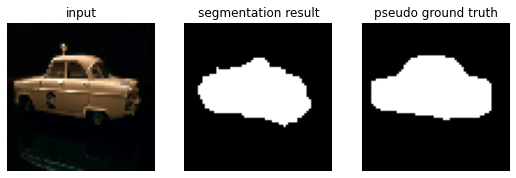

[*] Result of 103/290 (IoU: 0.834959)


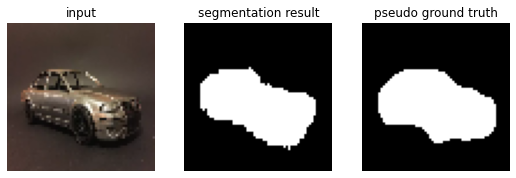

[*] Result of 104/290 (IoU: 0.837995)


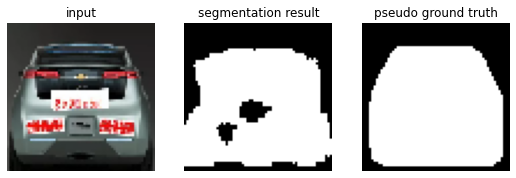

[*] Result of 105/290 (IoU: 0.808725)


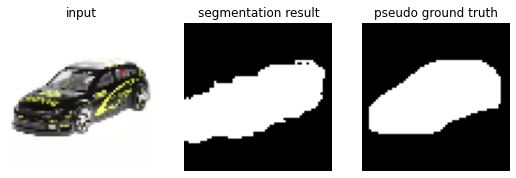

[*] Result of 106/290 (IoU: 0.836526)


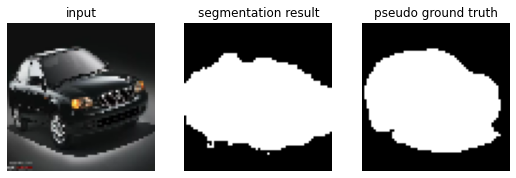

[*] Result of 107/290 (IoU: 0.825701)


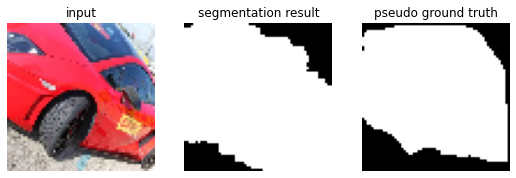

[*] Result of 108/290 (IoU: 0.839631)


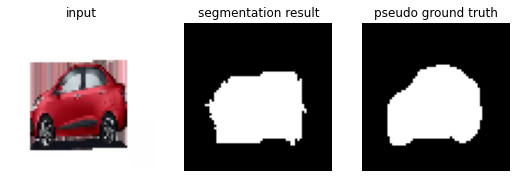

[*] Result of 109/290 (IoU: 0.817970)


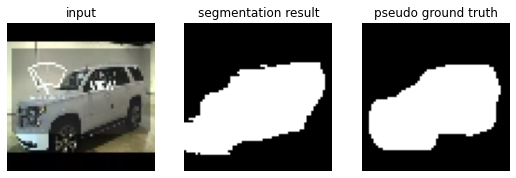

[*] Result of 110/290 (IoU: 0.869427)


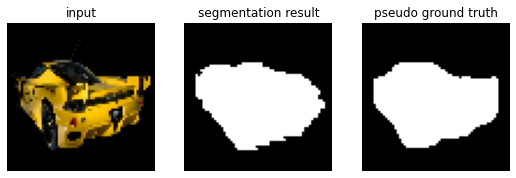

[*] Result of 111/290 (IoU: 0.850711)


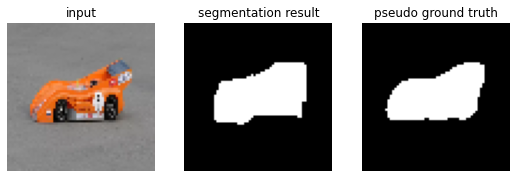

[*] Result of 112/290 (IoU: 0.811616)


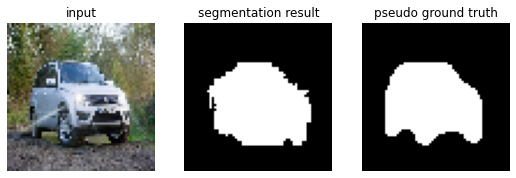

[*] Result of 113/290 (IoU: 0.818913)


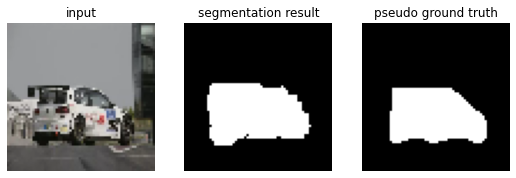

[*] Result of 114/290 (IoU: 0.824790)


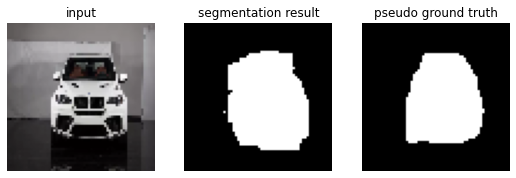

[*] Result of 115/290 (IoU: 0.850245)


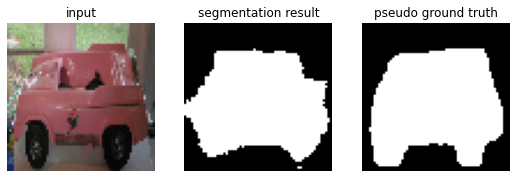

[*] Result of 116/290 (IoU: 0.835494)


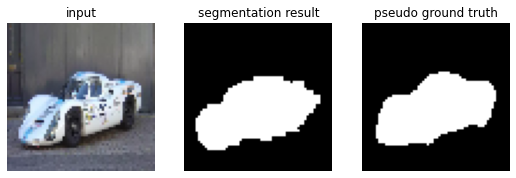

[*] Result of 117/290 (IoU: 0.808118)


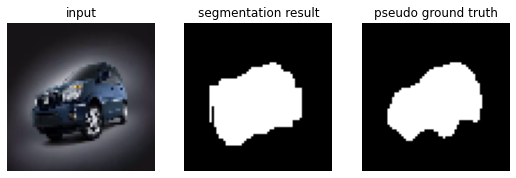

[*] Result of 118/290 (IoU: 0.807007)


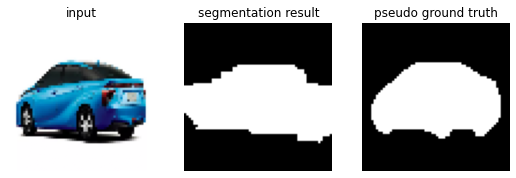

[*] Result of 119/290 (IoU: 0.815029)


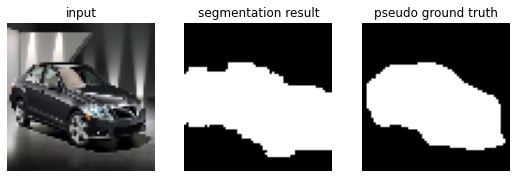

[*] Result of 120/290 (IoU: 0.819578)


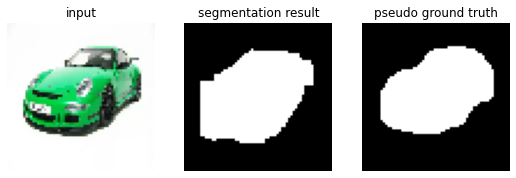

[*] Result of 121/290 (IoU: 0.811613)


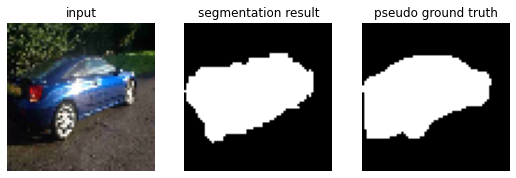

[*] Result of 122/290 (IoU: 0.859323)


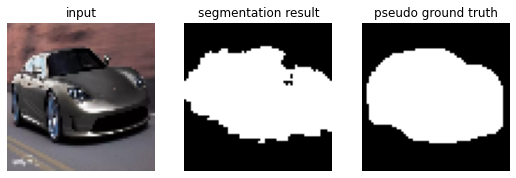

[*] Result of 123/290 (IoU: 0.892843)


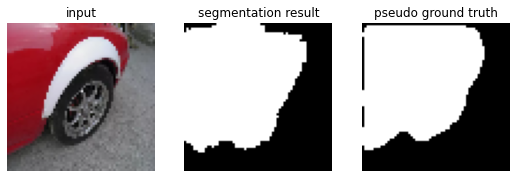

[*] Result of 124/290 (IoU: 0.817125)


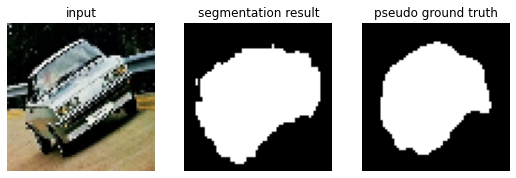

[*] Result of 125/290 (IoU: 0.816477)


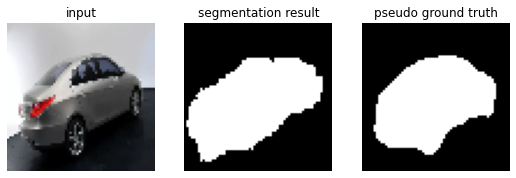

[*] Result of 126/290 (IoU: 0.807914)


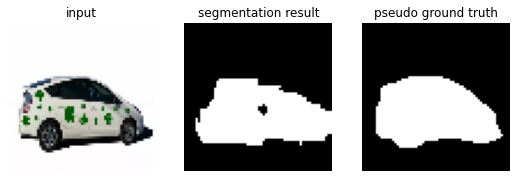

[*] Result of 127/290 (IoU: 0.808560)


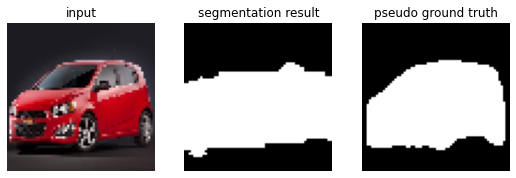

[*] Result of 128/290 (IoU: 0.802561)


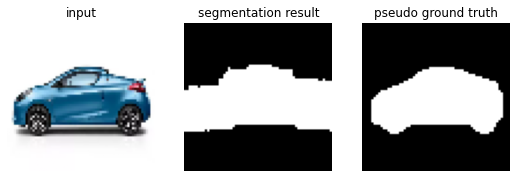

[*] Result of 129/290 (IoU: 0.821810)


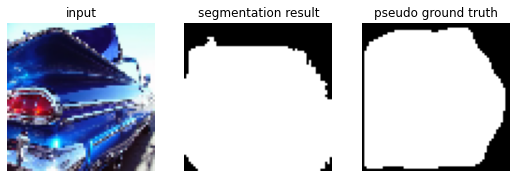

[*] Result of 130/290 (IoU: 0.813248)


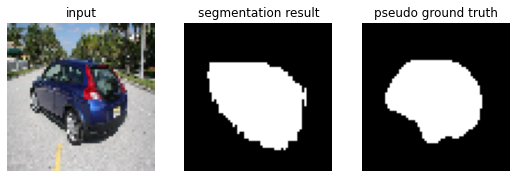

[*] Result of 131/290 (IoU: 0.813023)


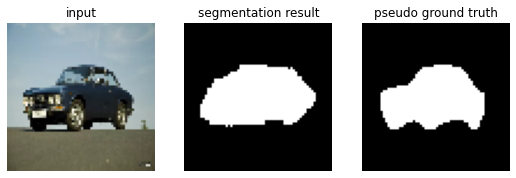

[*] Result of 132/290 (IoU: 0.824410)


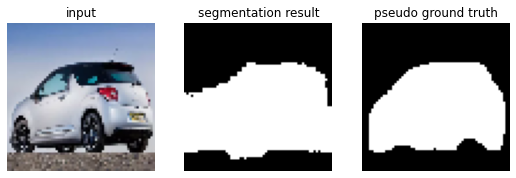

[*] Result of 133/290 (IoU: 0.806183)


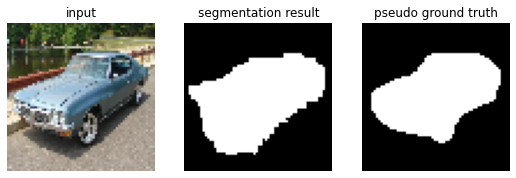

[*] Result of 134/290 (IoU: 0.835595)


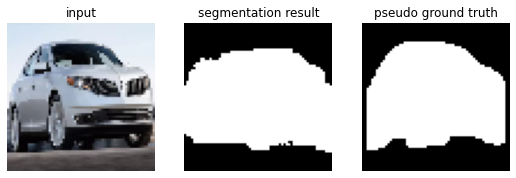

[*] Result of 135/290 (IoU: 0.817683)


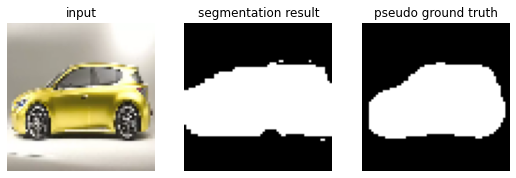

[*] Result of 136/290 (IoU: 0.835784)


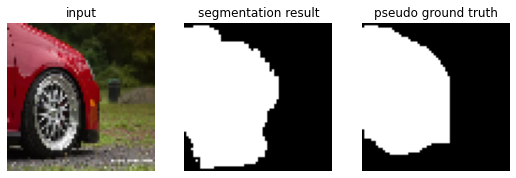

[*] Result of 137/290 (IoU: 0.811465)


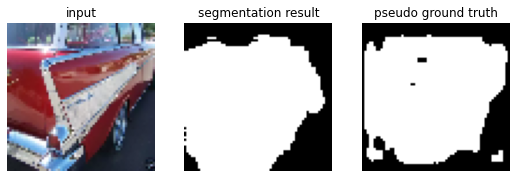

[*] Result of 138/290 (IoU: 0.802228)


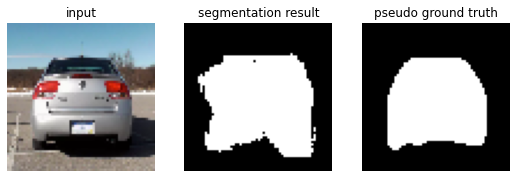

[*] Result of 139/290 (IoU: 0.847034)


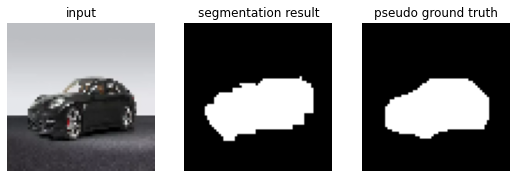

[*] Result of 140/290 (IoU: 0.828077)


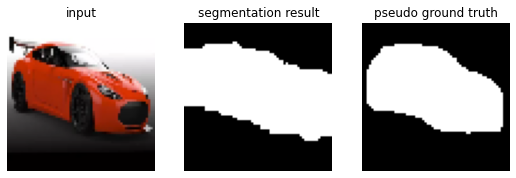

[*] Result of 141/290 (IoU: 0.813050)


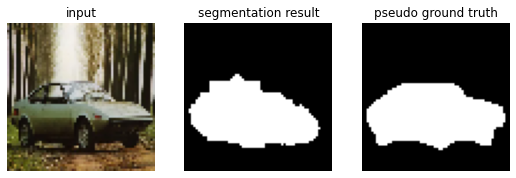

[*] Result of 142/290 (IoU: 0.850690)


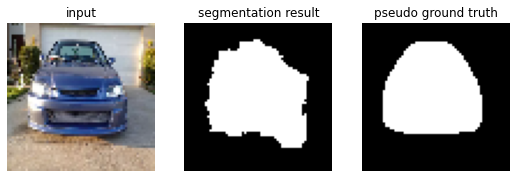

[*] Result of 143/290 (IoU: 0.840000)


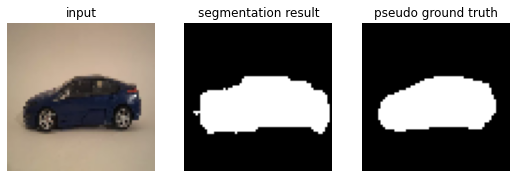

[*] Result of 144/290 (IoU: 0.865275)


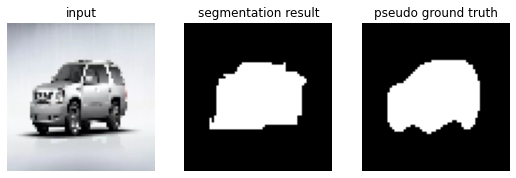

[*] Result of 145/290 (IoU: 0.826809)


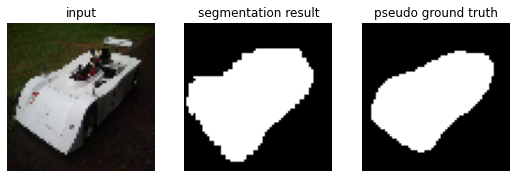

[*] Result of 146/290 (IoU: 0.829570)


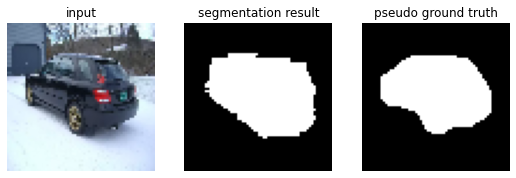

[*] Result of 147/290 (IoU: 0.814353)


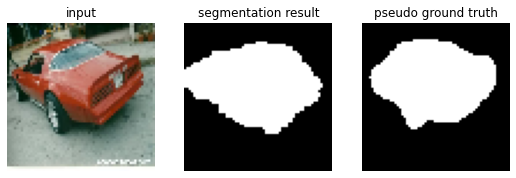

[*] Result of 148/290 (IoU: 0.831032)


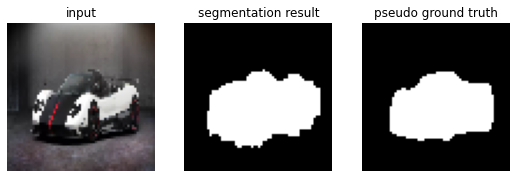

[*] Result of 149/290 (IoU: 0.822210)


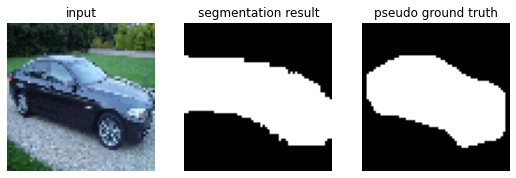

[*] Result of 150/290 (IoU: 0.809088)


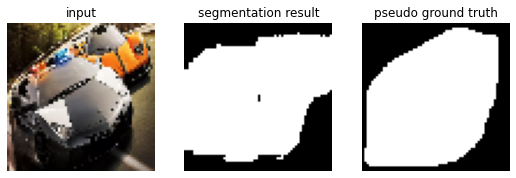

[*] Result of 151/290 (IoU: 0.812070)


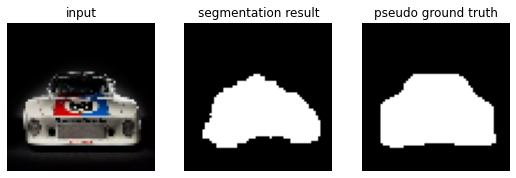

[*] Result of 152/290 (IoU: 0.861478)


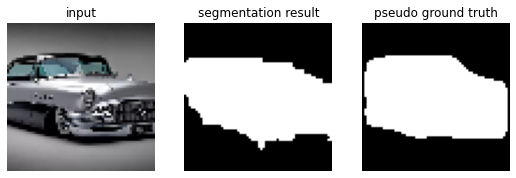

[*] Result of 153/290 (IoU: 0.816897)


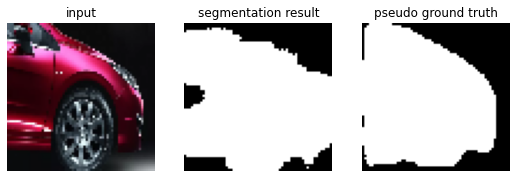

[*] Result of 154/290 (IoU: 0.817135)


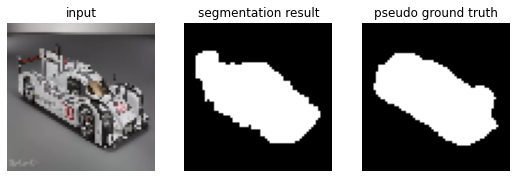

[*] Result of 155/290 (IoU: 0.851707)


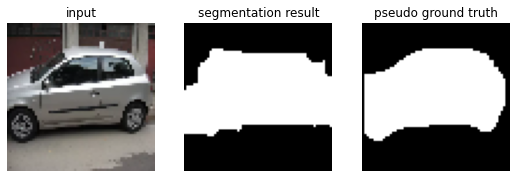

[*] Result of 156/290 (IoU: 0.834978)


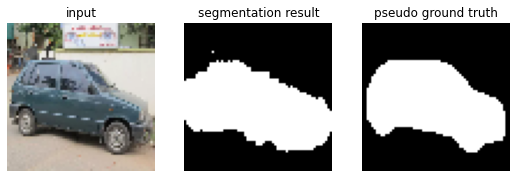

[*] Result of 157/290 (IoU: 0.842916)


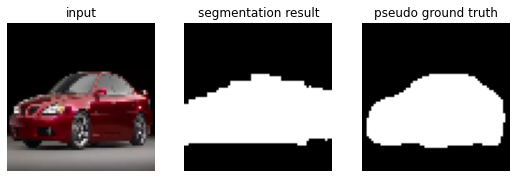

[*] Result of 158/290 (IoU: 0.826685)


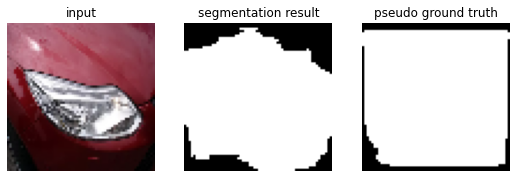

[*] Result of 159/290 (IoU: 0.841463)


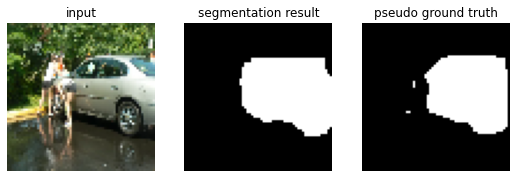

[*] Result of 160/290 (IoU: 0.800351)


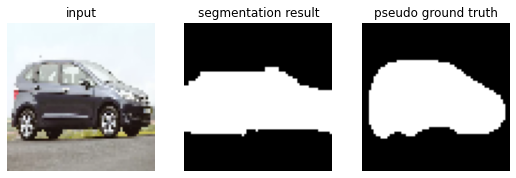

[*] Result of 161/290 (IoU: 0.847744)


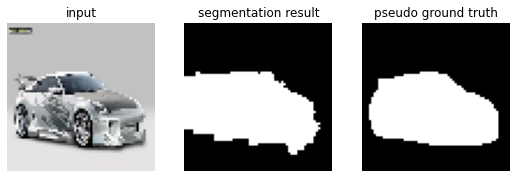

[*] Result of 162/290 (IoU: 0.809414)


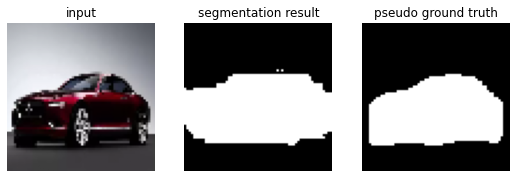

[*] Result of 163/290 (IoU: 0.837062)


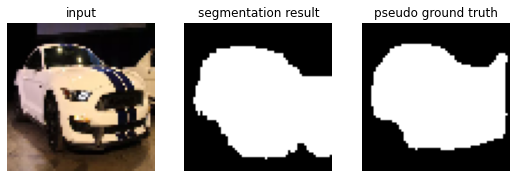

[*] Result of 164/290 (IoU: 0.800766)


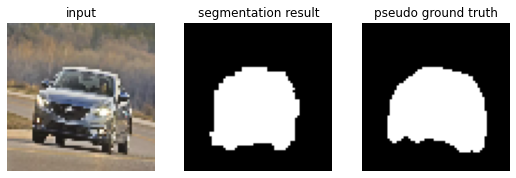

[*] Result of 165/290 (IoU: 0.821122)


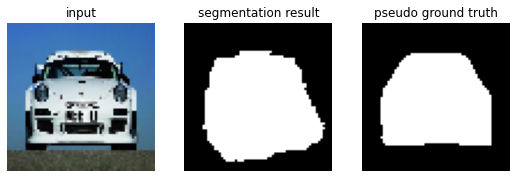

[*] Result of 166/290 (IoU: 0.802210)


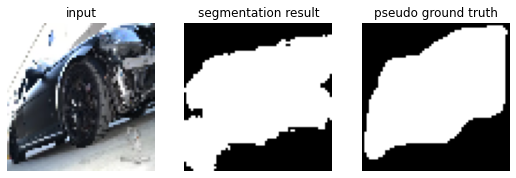

[*] Result of 167/290 (IoU: 0.821302)


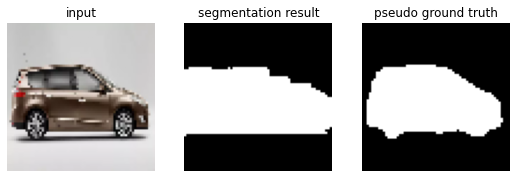

[*] Result of 168/290 (IoU: 0.812854)


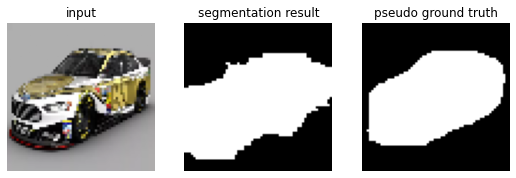

[*] Result of 169/290 (IoU: 0.841867)


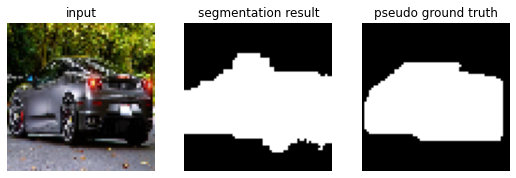

[*] Result of 170/290 (IoU: 0.802550)


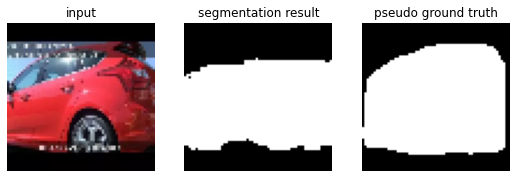

[*] Result of 171/290 (IoU: 0.809709)


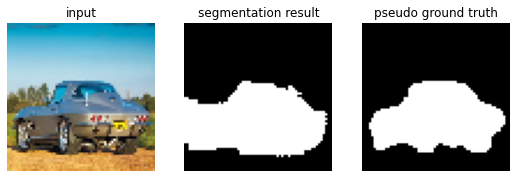

[*] Result of 172/290 (IoU: 0.825490)


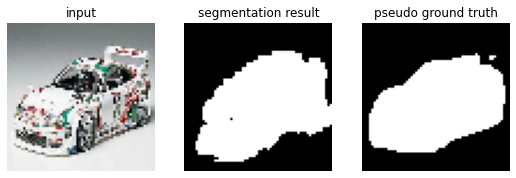

[*] Result of 173/290 (IoU: 0.801909)


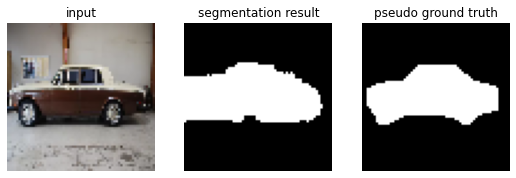

[*] Result of 174/290 (IoU: 0.840678)


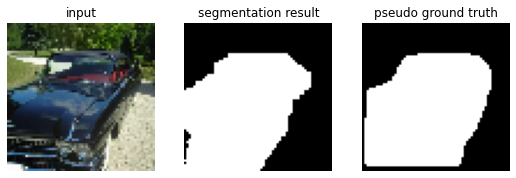

[*] Result of 175/290 (IoU: 0.914136)


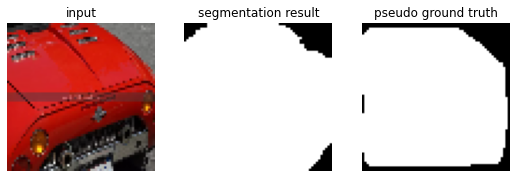

[*] Result of 176/290 (IoU: 0.856514)


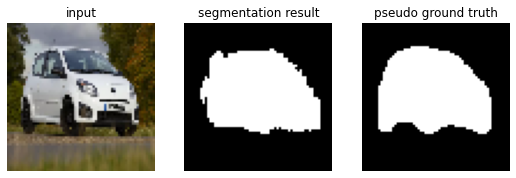

[*] Result of 177/290 (IoU: 0.805888)


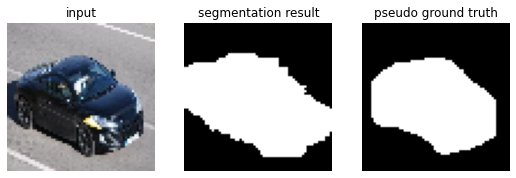

[*] Result of 178/290 (IoU: 0.838384)


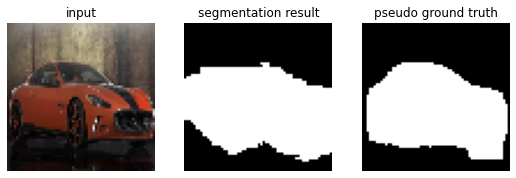

[*] Result of 179/290 (IoU: 0.821411)


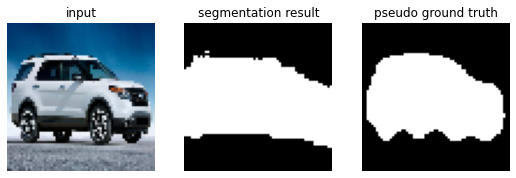

[*] Result of 180/290 (IoU: 0.893847)


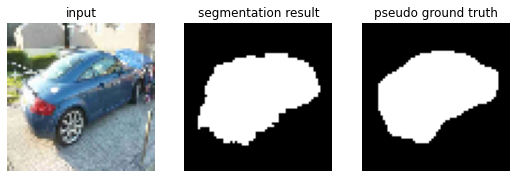

[*] Result of 181/290 (IoU: 0.810062)


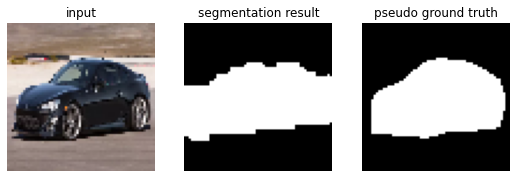

[*] Result of 182/290 (IoU: 0.801565)


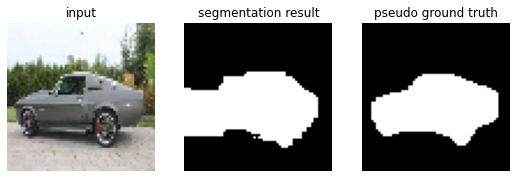

[*] Result of 183/290 (IoU: 0.803597)


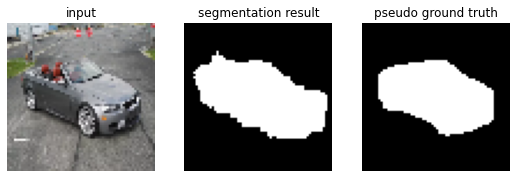

[*] Result of 184/290 (IoU: 0.821306)


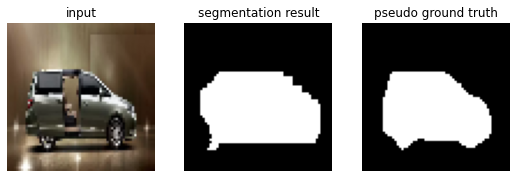

[*] Result of 185/290 (IoU: 0.832351)


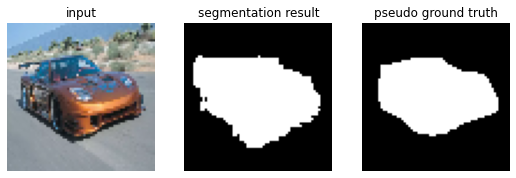

[*] Result of 186/290 (IoU: 0.822247)


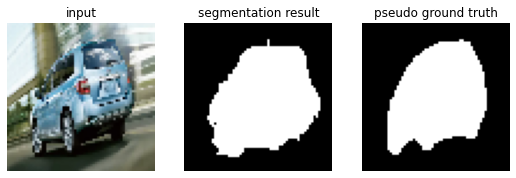

[*] Result of 187/290 (IoU: 0.822439)


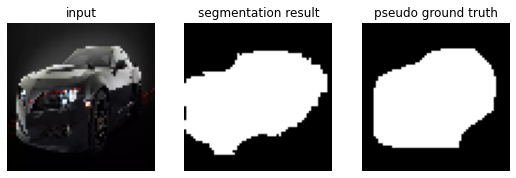

[*] Result of 188/290 (IoU: 0.831319)


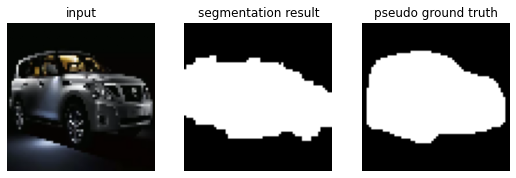

[*] Result of 189/290 (IoU: 0.850594)


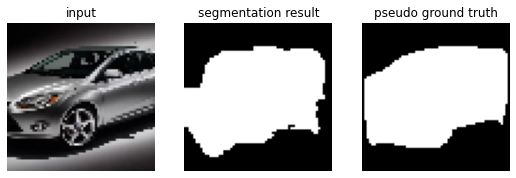

[*] Result of 190/290 (IoU: 0.830978)


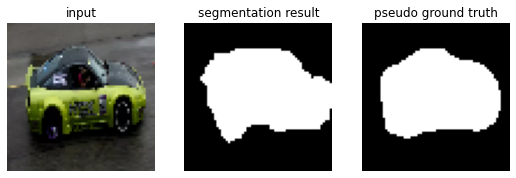

[*] Result of 191/290 (IoU: 0.811828)


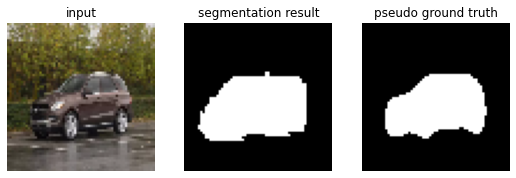

[*] Result of 192/290 (IoU: 0.817556)


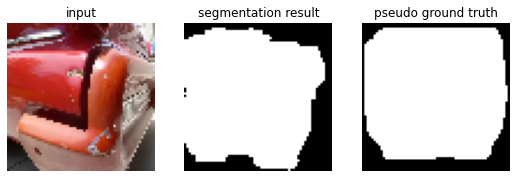

[*] Result of 193/290 (IoU: 0.806995)


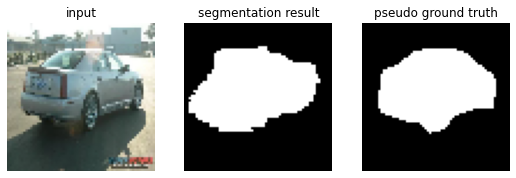

[*] Result of 194/290 (IoU: 0.834097)


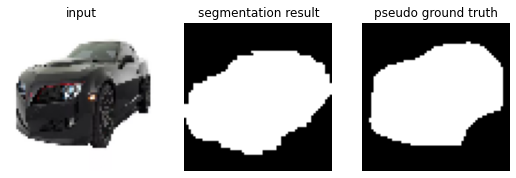

[*] Result of 195/290 (IoU: 0.859273)


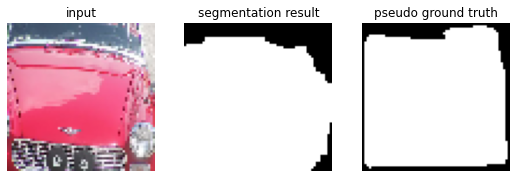

[*] Result of 196/290 (IoU: 0.803359)


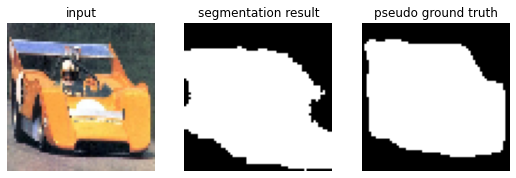

[*] Result of 197/290 (IoU: 0.858726)


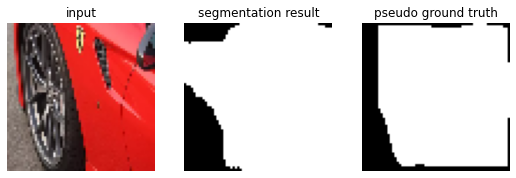

[*] Result of 198/290 (IoU: 0.823285)


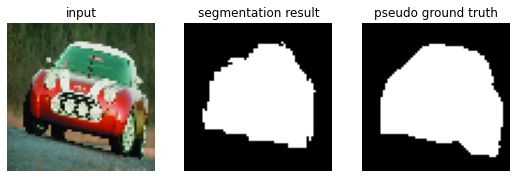

[*] Result of 199/290 (IoU: 0.820180)


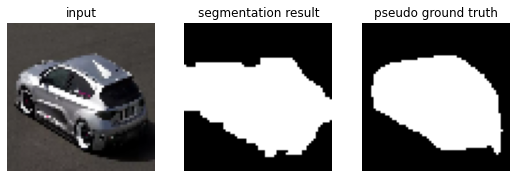

[*] Result of 200/290 (IoU: 0.829244)


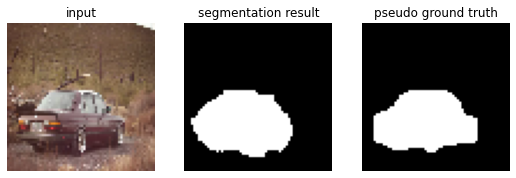

[*] Result of 201/290 (IoU: 0.812451)


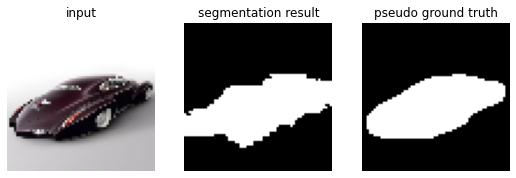

[*] Result of 202/290 (IoU: 0.836133)


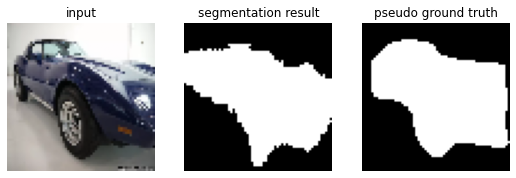

[*] Result of 203/290 (IoU: 0.808219)


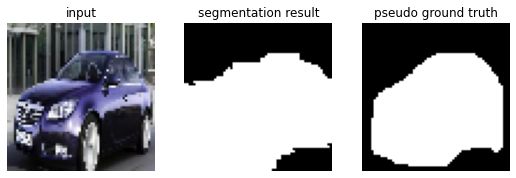

[*] Result of 204/290 (IoU: 0.820679)


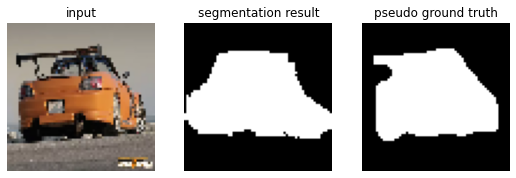

[*] Result of 205/290 (IoU: 0.802007)


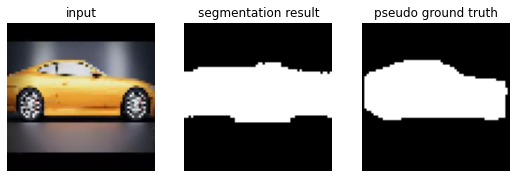

[*] Result of 206/290 (IoU: 0.828261)


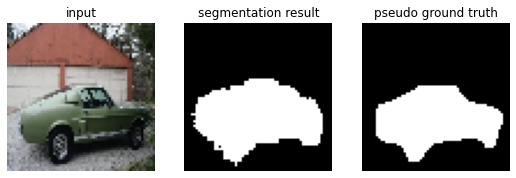

[*] Result of 207/290 (IoU: 0.801255)


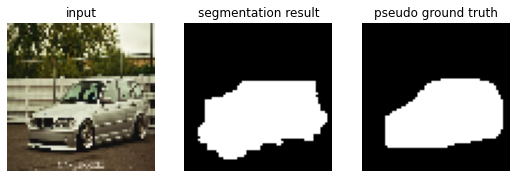

[*] Result of 208/290 (IoU: 0.800343)


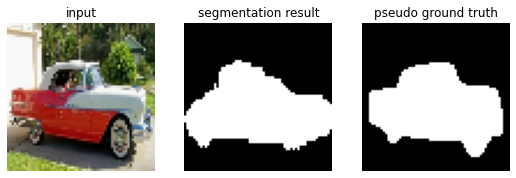

[*] Result of 209/290 (IoU: 0.834623)


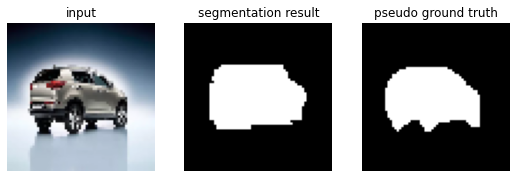

[*] Result of 210/290 (IoU: 0.823810)


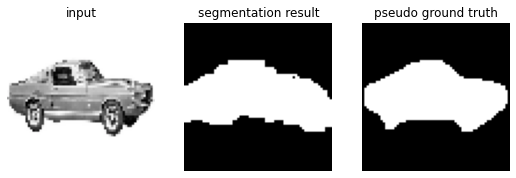

[*] Result of 211/290 (IoU: 0.825444)


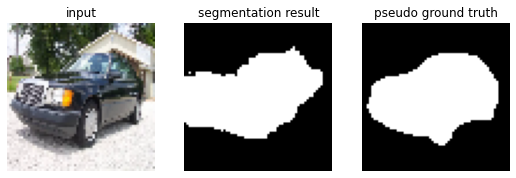

[*] Result of 212/290 (IoU: 0.860722)


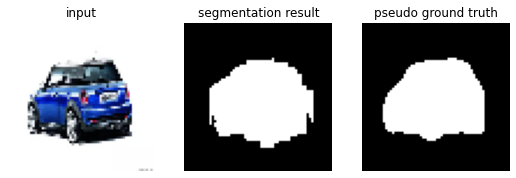

[*] Result of 213/290 (IoU: 0.838813)


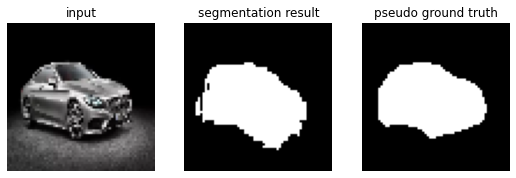

[*] Result of 214/290 (IoU: 0.859572)


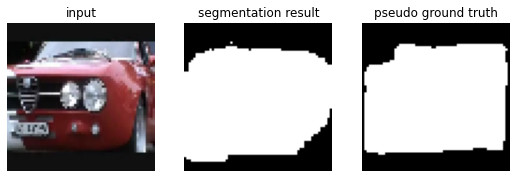

[*] Result of 215/290 (IoU: 0.806452)


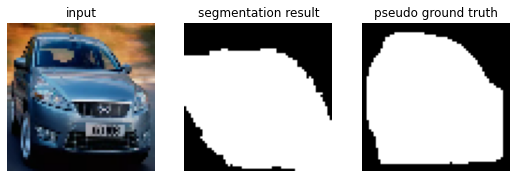

[*] Result of 216/290 (IoU: 0.805451)


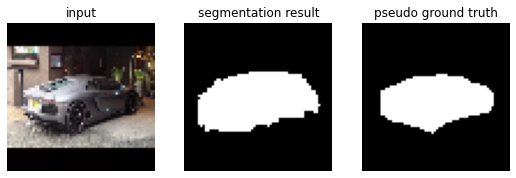

[*] Result of 217/290 (IoU: 0.829020)


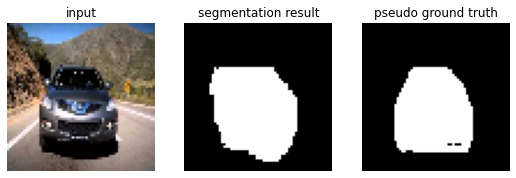

[*] Result of 218/290 (IoU: 0.861030)


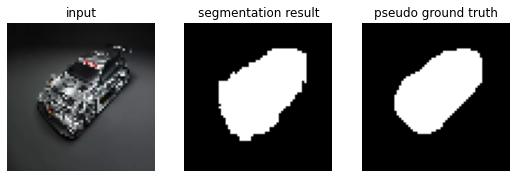

[*] Result of 219/290 (IoU: 0.820648)


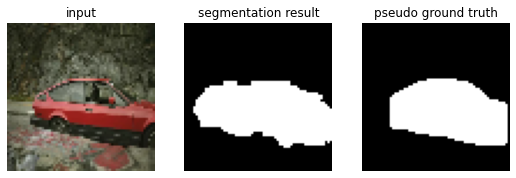

[*] Result of 220/290 (IoU: 0.809778)


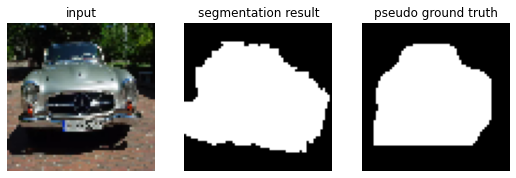

[*] Result of 221/290 (IoU: 0.802825)


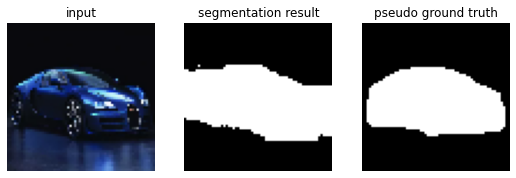

[*] Result of 222/290 (IoU: 0.813030)


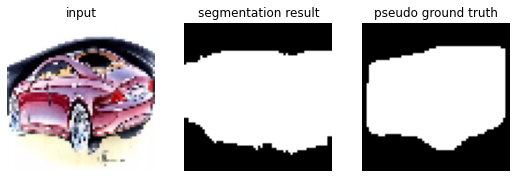

[*] Result of 223/290 (IoU: 0.803640)


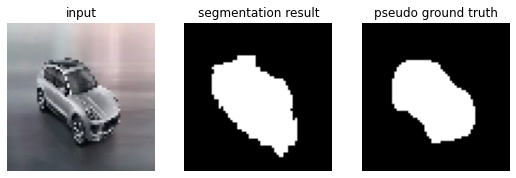

[*] Result of 224/290 (IoU: 0.800784)


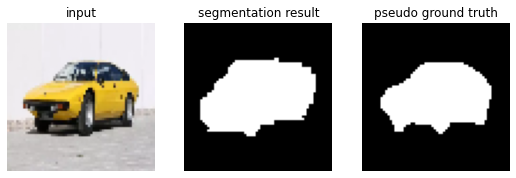

[*] Result of 225/290 (IoU: 0.814011)


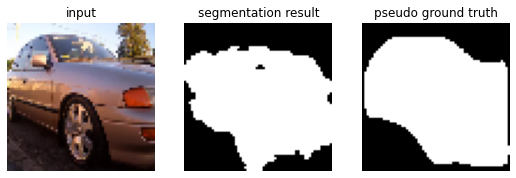

[*] Result of 226/290 (IoU: 0.845041)


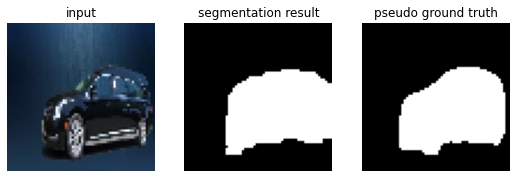

[*] Result of 227/290 (IoU: 0.815801)


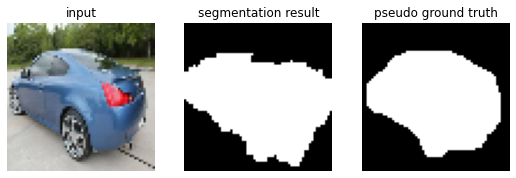

[*] Result of 228/290 (IoU: 0.804296)


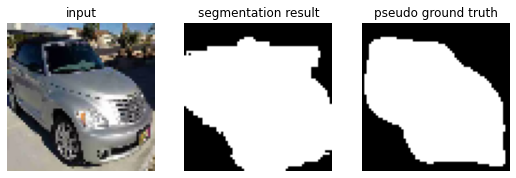

[*] Result of 229/290 (IoU: 0.804031)


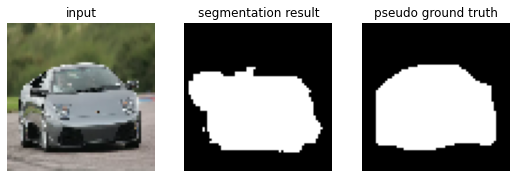

[*] Result of 230/290 (IoU: 0.811373)


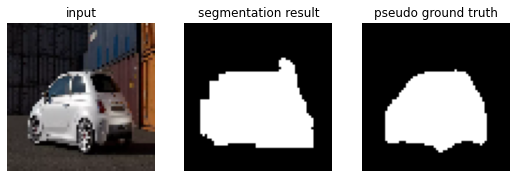

[*] Result of 231/290 (IoU: 0.819002)


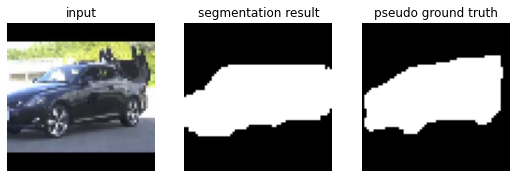

[*] Result of 232/290 (IoU: 0.810680)


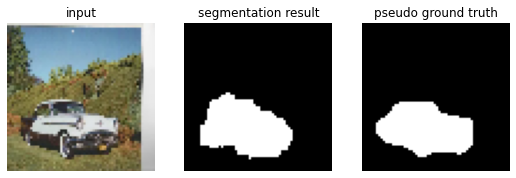

[*] Result of 233/290 (IoU: 0.807209)


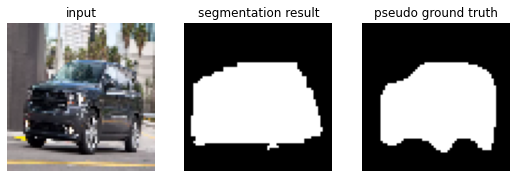

[*] Result of 234/290 (IoU: 0.859526)


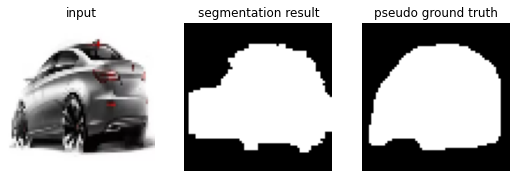

[*] Result of 235/290 (IoU: 0.864970)


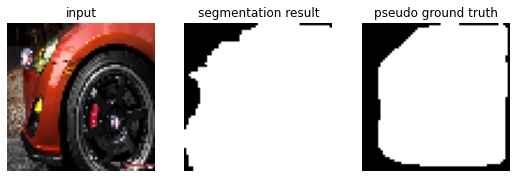

[*] Result of 236/290 (IoU: 0.836579)


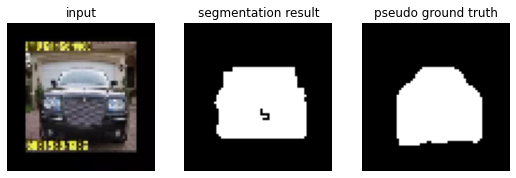

[*] Result of 237/290 (IoU: 0.800000)


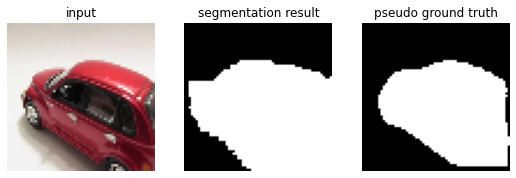

[*] Result of 238/290 (IoU: 0.863576)


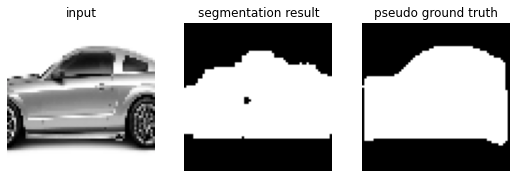

[*] Result of 239/290 (IoU: 0.803359)


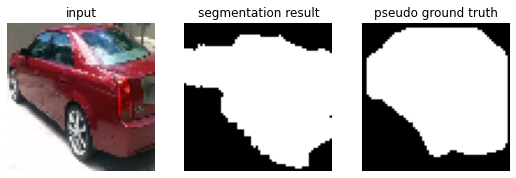

[*] Result of 240/290 (IoU: 0.803571)


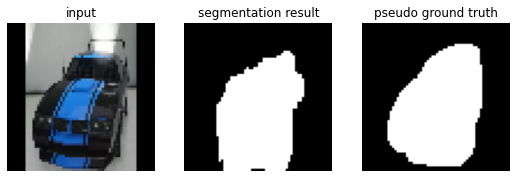

[*] Result of 241/290 (IoU: 0.805658)


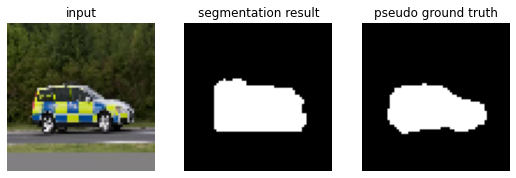

[*] Result of 242/290 (IoU: 0.808882)


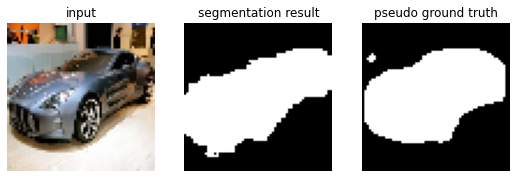

[*] Result of 243/290 (IoU: 0.831757)


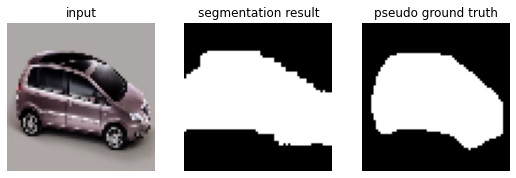

[*] Result of 244/290 (IoU: 0.804548)


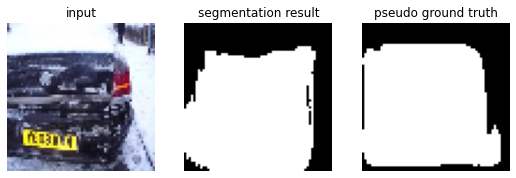

[*] Result of 245/290 (IoU: 0.802556)


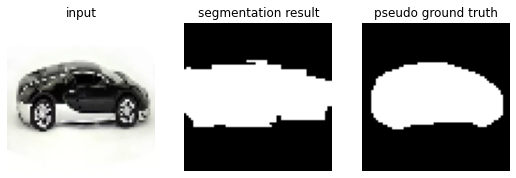

[*] Result of 246/290 (IoU: 0.841846)


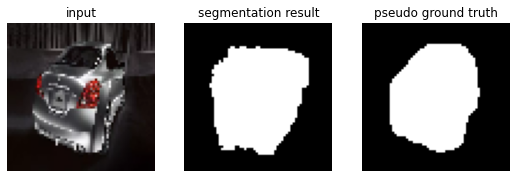

[*] Result of 247/290 (IoU: 0.812265)


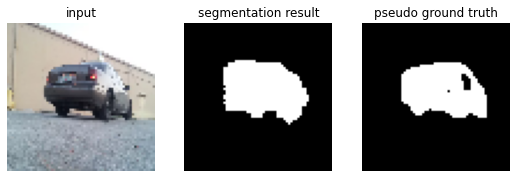

[*] Result of 248/290 (IoU: 0.802099)


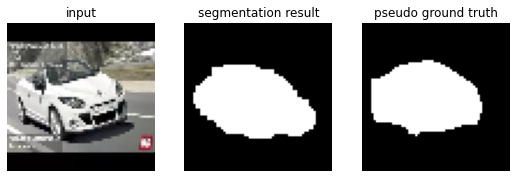

[*] Result of 249/290 (IoU: 0.800342)


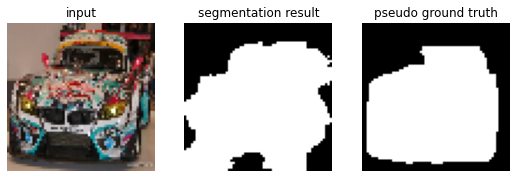

[*] Result of 250/290 (IoU: 0.801358)


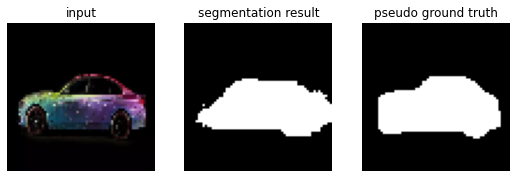

[*] Result of 251/290 (IoU: 0.821226)


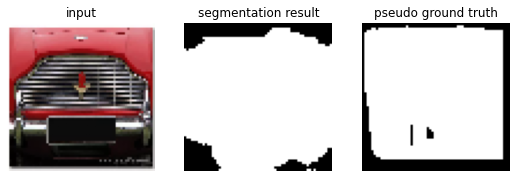

[*] Result of 252/290 (IoU: 0.821397)


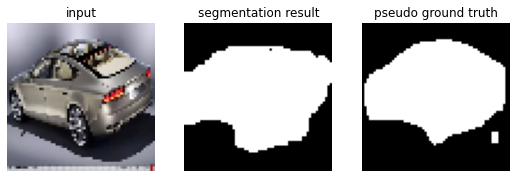

[*] Result of 253/290 (IoU: 0.806580)


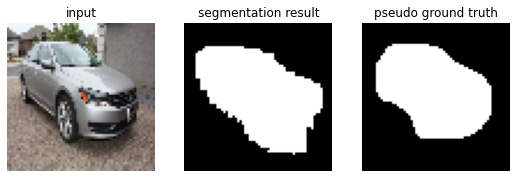

[*] Result of 254/290 (IoU: 0.807322)


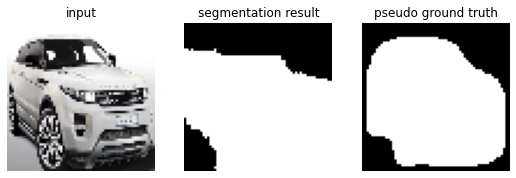

[*] Result of 255/290 (IoU: 0.889544)


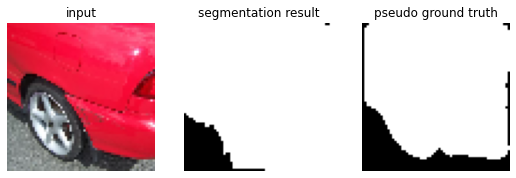

[*] Result of 256/290 (IoU: 0.807667)


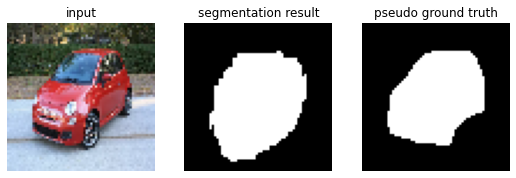

[*] Result of 257/290 (IoU: 0.824724)


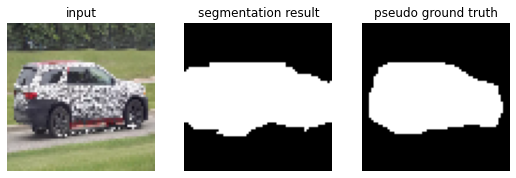

[*] Result of 258/290 (IoU: 0.813246)


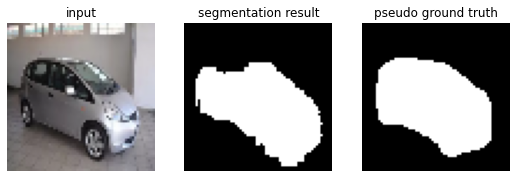

[*] Result of 259/290 (IoU: 0.808878)


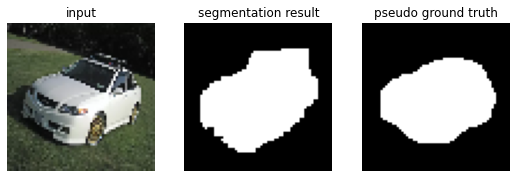

[*] Result of 260/290 (IoU: 0.821656)


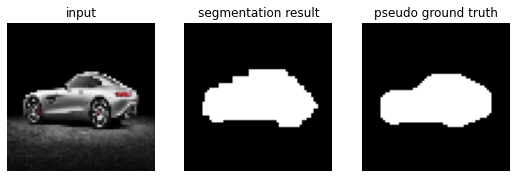

[*] Result of 261/290 (IoU: 0.836817)


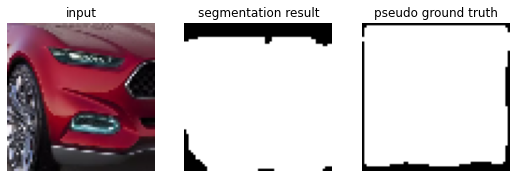

[*] Result of 262/290 (IoU: 0.837187)


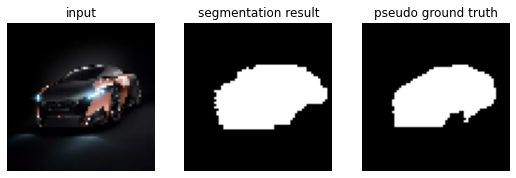

[*] Result of 263/290 (IoU: 0.819988)


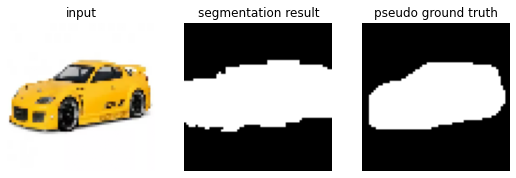

[*] Result of 264/290 (IoU: 0.825044)


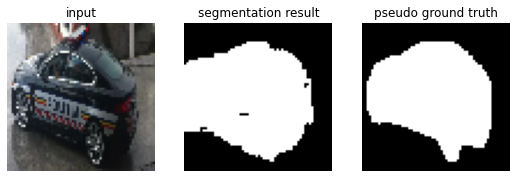

[*] Result of 265/290 (IoU: 0.802959)


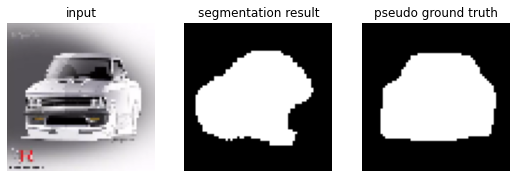

[*] Result of 266/290 (IoU: 0.806742)


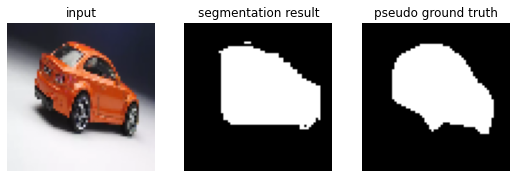

[*] Result of 267/290 (IoU: 0.847005)


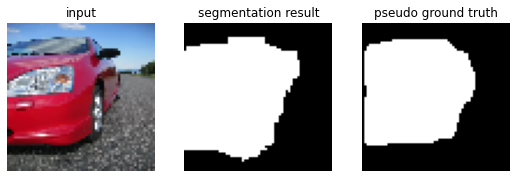

[*] Result of 268/290 (IoU: 0.891610)


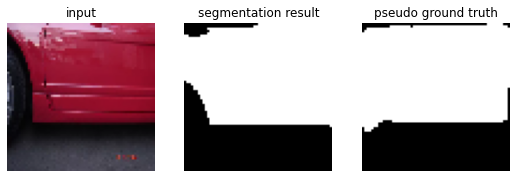

[*] Result of 269/290 (IoU: 0.807621)


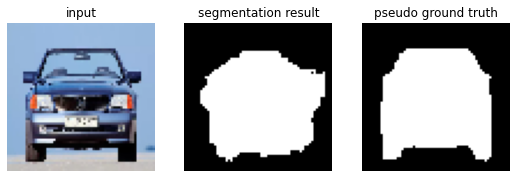

[*] Result of 270/290 (IoU: 0.847634)


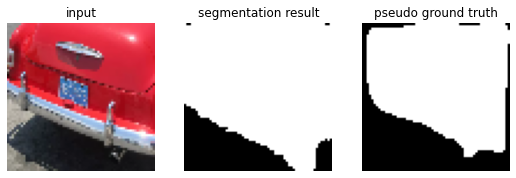

[*] Result of 271/290 (IoU: 0.829093)


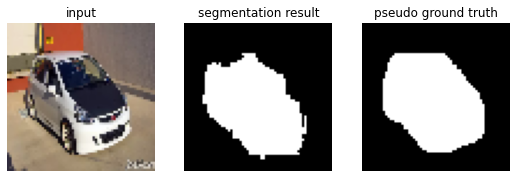

[*] Result of 272/290 (IoU: 0.874245)


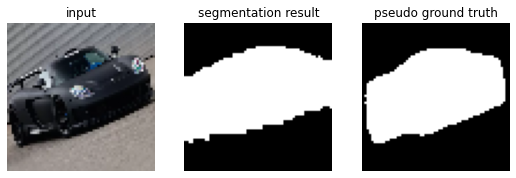

[*] Result of 273/290 (IoU: 0.809430)


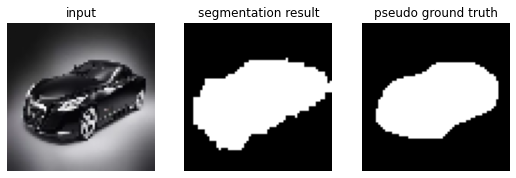

[*] Result of 274/290 (IoU: 0.831761)


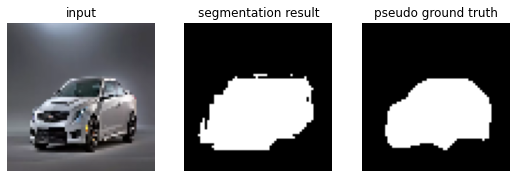

[*] Result of 275/290 (IoU: 0.835873)


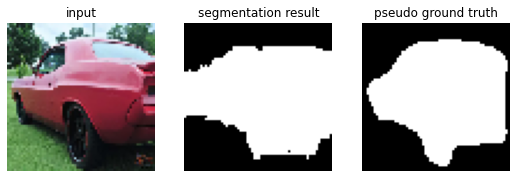

[*] Result of 276/290 (IoU: 0.838583)


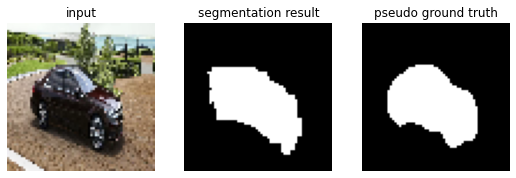

[*] Result of 277/290 (IoU: 0.813445)


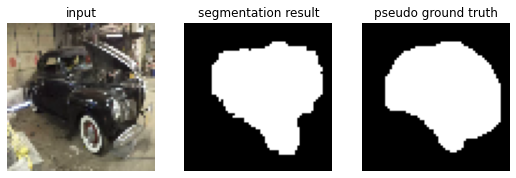

[*] Result of 278/290 (IoU: 0.806846)


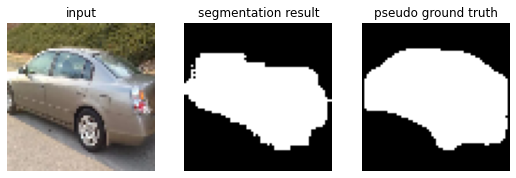

[*] Result of 279/290 (IoU: 0.856075)


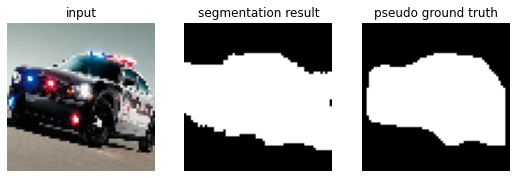

[*] Result of 280/290 (IoU: 0.824030)


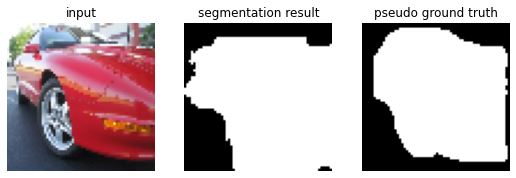

[*] Result of 281/290 (IoU: 0.816187)


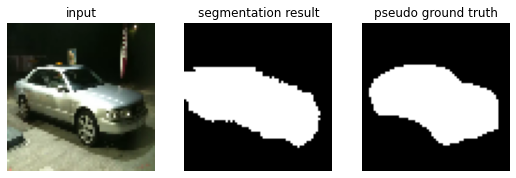

[*] Result of 282/290 (IoU: 0.829281)


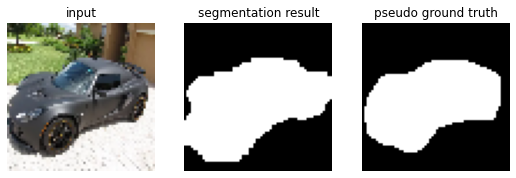

[*] Result of 283/290 (IoU: 0.815287)


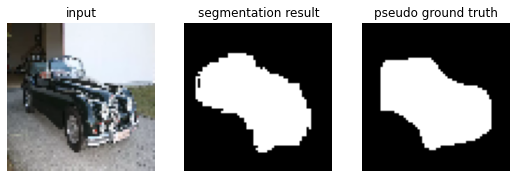

[*] Result of 284/290 (IoU: 0.877703)


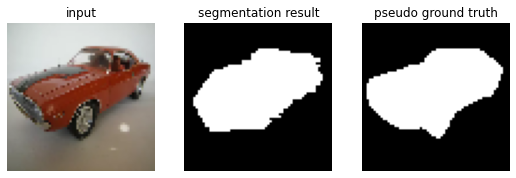

[*] Result of 285/290 (IoU: 0.809723)


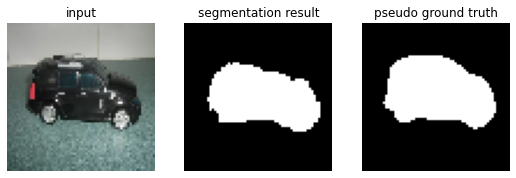

[*] Result of 286/290 (IoU: 0.843765)


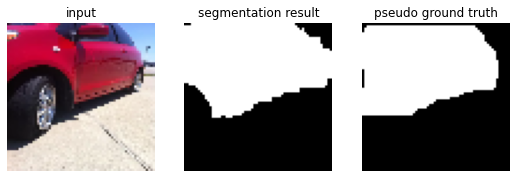

[*] Result of 287/290 (IoU: 0.828034)


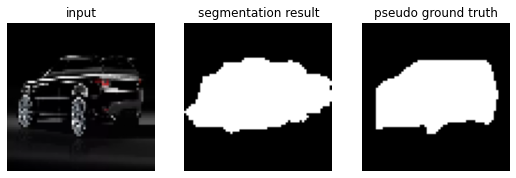

[*] Result of 288/290 (IoU: 0.826135)


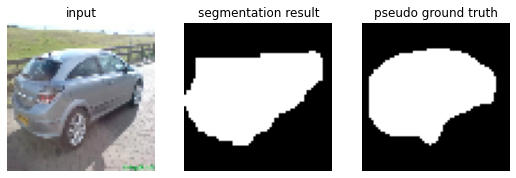

[*] Result of 289/290 (IoU: 0.808798)


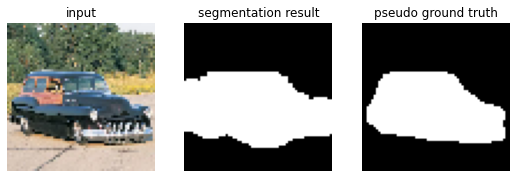

[*] Result of 290/290 (IoU: 0.827745)


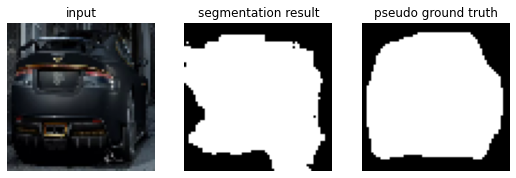

In [6]:
t = Variable(torch.Tensor([0.5])).to(device) # set threshold value

test_scores_sum_iou = 0
num_iters_test = 0

model_segment_encoder.eval()
model_segment_decoder_seg.eval()
model_segment_decoder_region.eval()

num_img = 0

for i, data_input in enumerate(loader_test, 0):
    imgs_input = Variable(data_input[0].type(Tensor)).to(device)
    imgs_gt = Variable(data_input[1].type(Tensor)).to(device)

    # get segmentation mask
    code = model_segment_encoder(imgs_input)
    imgs_seg = model_segment_decoder_seg(code)
    imgs_roi, imgs_bg = model_segment_decoder_region(code)

    num_iters_test += 1

    imgs_seg = (imgs_seg > t).float() * 1
    imgs_gt = (imgs_gt > t).float() * 1
    # flatten input and ground truth images
    metric_iou = metric_seg.evaluate_iou(imgs_seg, imgs_gt)

    # Collect score info
    test_scores_sum_iou += metric_iou

    # Plot result images
    for i_img in range(imgs_input.shape[0]):
        num_img += 1
        img = np.transpose(imgs_input[i_img].cpu().detach().numpy(), (1,2,0))
        seg = np.transpose(imgs_seg[i_img].cpu().detach().numpy(), (1,2,0))
        gt = np.transpose(imgs_gt[i_img].cpu().detach().numpy(), (1,2,0))
        names = ['input', 'segmentation result', 'pseudo ground truth']
        images = [img, seg, gt]
        print('==============================================================')
        print('[*] Result of %03d/%03d (IoU: %.6f)' % (num_img, len(dataset_test), metric_seg.evaluate_iou(imgs_seg[i_img], imgs_gt[i_img])))
        fig, axes = plt.subplots(1, 3, figsize=(9,3))
        for i, ax in enumerate(axes.flat):
            ax.axis("off")
            ax.set_title(names[i])
            if i in [1, 2]:
                ax.imshow(images[i], cmap='gray', vmin=0., vmax=1.)
            else:
                ax.imshow(images[i], vmin=0., vmax=1.)
            if i+1 == 3:
                break
        plt.show()
        plt.clf()
        plt.close()

### Get average IoU of sample data

In [7]:
# get avg iou
test_avg_iou = test_scores_sum_iou/num_iters_test

print('[*TEST*] [Avg IoU: {}]'.format(test_avg_iou))

[*TEST*] [Avg IoU: 0.82335333574549]
